In [1]:
import os
import pathlib

import warnings
warnings.filterwarnings("ignore")

import FunctionLib as FL
from tqdm import tqdm

import numpy as np
import pandas as pd
import scipy
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['font.family'] = 'serif'

import matplotlib as mpl
import matplotlib.pyplot as plt

from matplotlib.ticker import AutoMinorLocator
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import matplotlib.patches as patches
config = {
    "font.size": 18,
    "font.family": "serif",
    "figure.figsize": (25, 14),

    "axes.titlesize": 28,        # ax.set_title fontsize
    "axes.labelsize": 24,        # ax.set_xlabel/ylabel fontsize
    "legend.fontsize": 20,       # ax.legend fontsize
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,

    "axes.linewidth": 2,         # 对应 ax.spines...linewidth
    "axes.edgecolor": "black",   # 对应 ax.spines...color

    "xtick.direction": "in",     # direction='in'
    "ytick.direction": "in",
    "xtick.top": True,           # ax.xaxis.set_ticks_position('both')
    "ytick.right": True,         # ax.yaxis.set_ticks_position('both')

    "xtick.major.width": 2,
    "ytick.major.width": 2,
    "xtick.minor.width": 2,      # which='both' implies minor too
    "ytick.minor.width": 2,

    "xtick.major.size": 6,       # length=6 major
    "ytick.major.size": 6,
    "xtick.minor.size": 3,       # length=3 minor
    "ytick.minor.size": 3,
}
plt.rcParams.update(config)
from matplotlib.ticker import AutoMinorLocator

import astropy
import astropy.units as u
import seaborn as sns

DJAv4Catalog = FL.Spectrum_Catalog()
DJAv4Catalog.load_from_pkl(('./DJAV4.2Catalog.pkl'))
print(DJAv4Catalog.sample_num())
DJAv4Catalog.to_dataframe()

1102


,survey_id_subid,prism_filepath,prism_redshift,determined_redshift,grating_filepaths,grating_redshifts,file_count,available_filters,properties,survey_id,sample_flag,reason_for_exclusion,grating_within_coverage,grating_slitloss_correction,lines_fit,line_ratios,dust_curve_parameters
0,snh0pe-v4_4446_102,/home/xingyaocai/DJAv4.2/snh0pe-v4/snh0pe-v4_p...,0.2259,0.2259,{'g140m-f100lp': '/home/xingyaocai/DJAv4.2/snh...,"{'g140m-f100lp': nan, 'g235m-f170lp': nan}",3,"{g140m-f100lp, prism-clear, g235m-f170lp}",{'redshift_conflict': False},snh0pe-v4,False,"[redshift_below_3, redshift_below_3]",{},{},{},{},{}
1,snh0pe-v4_4446_143,/home/xingyaocai/DJAv4.2/snh0pe-v4/snh0pe-v4_p...,1.6318,1.6311,{'g140m-f100lp': '/home/xingyaocai/DJAv4.2/snh...,"{'g140m-f100lp': 1.6313, 'g235m-f170lp': 1.6309}",3,"{g140m-f100lp, prism-clear, g235m-f170lp}",{'redshift_conflict': False},snh0pe-v4,False,"[redshift_below_3, redshift_below_3]",{},{},{},{},{}
2,snh0pe-v4_4446_285,/home/xingyaocai/DJAv4.2/snh0pe-v4/snh0pe-v4_p...,0.4446,0.4462,{'g235m-f170lp': '/home/xingyaocai/DJAv4.2/snh...,"{'g235m-f170lp': 0.4462, 'g140m-f100lp': 0.4462}",3,"{g140m-f100lp, prism-clear, g235m-f170lp}",{'redshift_conflict': False},snh0pe-v4,False,"[redshift_below_3, redshift_below_3]",{},{},{},{},{}
3,snh0pe-v4_4446_29,/home/xingyaocai/DJAv4.2/snh0pe-v4/snh0pe-v4_p...,1.7834,1.77975,{'g140m-f100lp': '/home/xingyaocai/DJAv4.2/snh...,"{'g140m-f100lp': 1.7799, 'g235m-f170lp': 1.7796}",3,"{g140m-f100lp, prism-clear, g235m-f170lp}",{'redshift_conflict': False},snh0pe-v4,False,"[redshift_below_3, redshift_below_3]",{},{},{},{},{}
4,snh0pe-v4_4446_123,/home/xingyaocai/DJAv4.2/snh0pe-v4/snh0pe-v4_p...,1.7855,1.7855,{'g140m-f100lp': '/home/xingyaocai/DJAv4.2/snh...,"{'g140m-f100lp': 1.7855, 'g235m-f170lp': 1.7851}",3,"{g140m-f100lp, prism-clear, g235m-f170lp}",{'redshift_conflict': False},snh0pe-v4,False,"[redshift_below_3, redshift_below_3]",{},{},{},{},{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43037,glimpse-obs02-v4_9223_9152,None,None,5.5385,{'g395m-f290lp': '/home/xingyaocai/DJAv4.2/gli...,{'g395m-f290lp': 5.5385},1,{g395m-f290lp},{'redshift_conflict': False},glimpse-obs02-v4,False,[no_prism_spectrum],{},{},{},{},{}
43038,glimpse-obs02-v4_9223_98001,None,None,2.6322,{'g395m-f290lp': '/home/xingyaocai/DJAv4.2/gli...,{'g395m-f290lp': 2.6322},1,{g395m-f290lp},{'redshift_conflict': False},glimpse-obs02-v4,False,"[redshift_below_3, no_prism_spectrum]",{},{},{},{},{}
43039,glimpse-obs02-v4_9223_47046,None,None,4.3554,{'g395m-f290lp': '/home/xingyaocai/DJAv4.2/gli...,{'g395m-f290lp': 4.3554},1,{g395m-f290lp},{'redshift_conflict': False},glimpse-obs02-v4,False,[no_prism_spectrum],{},{},{},{},{}
43040,glimpse-obs02-v4_9223_45350,None,None,1.3675,{'g395m-f290lp': '/home/xingyaocai/DJAv4.2/gli...,{'g395m-f290lp': 1.3675},1,{g395m-f290lp},{'redshift_conflict': False},glimpse-obs02-v4,False,"[redshift_below_3, no_prism_spectrum]",{},{},{},{},{}


In [2]:
redshift_list=[]

for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
    if not catalog['sample_flag']:
        continue
    redshift_list.append(catalog['determined_redshift'])

redshift_list=np.array(redshift_list)

## different redshift bins



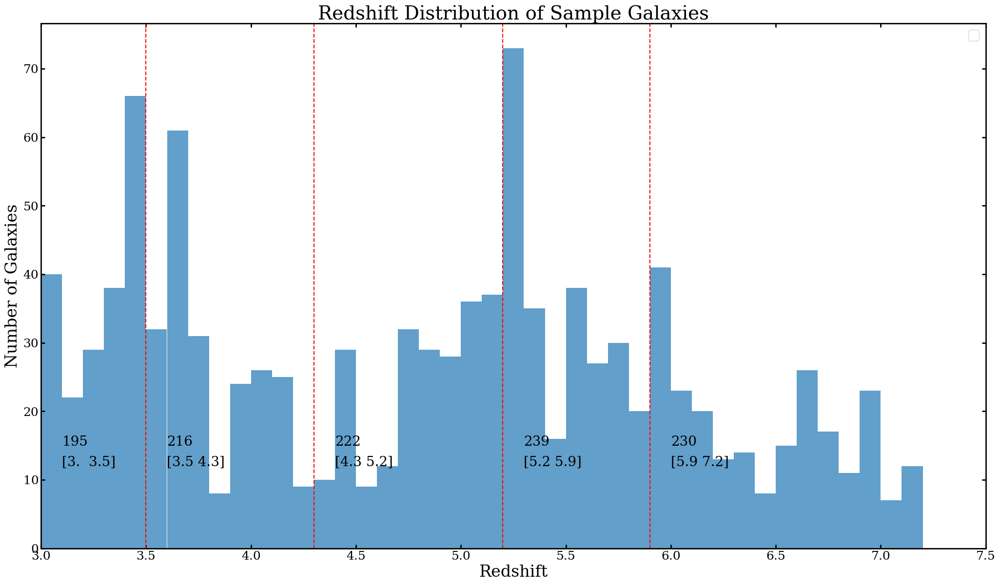

In [39]:
redshift_conditions=np.array([[3,3.5],[3.5,4.3],[4.3,5.2],[5.2,5.9],[5.9,7.2]])
fig, ax=plt.subplots(figsize=(25,14))

def redshift_condition_func(z,redshift_conditions=redshift_conditions):
    for i, condition in enumerate(redshift_conditions):
        if condition[0]<=z<condition[1]:
            return i

ax.hist(redshift_list, bins=50,range=(3,8), alpha=0.7)
ax.set_xlabel('Redshift',fontsize=24)
ax.set_ylabel('Number of Galaxies',fontsize=24)

ax.spines['bottom'].set_linewidth(2)
ax.spines['top'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['right'].set_color('black')
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.xaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
ax.yaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
ax.xaxis.set_tick_params(length=6, which='major')
ax.xaxis.set_tick_params(length=3, which='minor')
ax.yaxis.set_tick_params(length=6, which='major')
ax.yaxis.set_tick_params(length=3, which='minor')
ax.legend(fontsize=20, loc='best')
ax.set_xlim(3,7.5)
for bin_edge in redshift_conditions:
    ax.axvline(bin_edge[0], color='r', linestyle='dashed')
    ax.text(bin_edge[0]+0.1, 15, f'{np.sum((redshift_list >= bin_edge[0]) & (redshift_list < bin_edge[1]))}', color='k', fontsize=20)
    ax.text(bin_edge[0]+0.1, 12, f'{bin_edge}', color='k', fontsize=20)
ax.set_title('Redshift Distribution of Sample Galaxies', fontsize=28)
plt.savefig('Redshift_Binning.pdf', bbox_inches='tight')

In [9]:
group_conditions = [(-0.2,0.02),(0.02,0.10), (0.10,0.2),(0.2,0.3),(0.3,0.40),(0.40,0.6)]

def group_condition_func(balmer_decrement):
    for i, (low, high) in enumerate(group_conditions):
        if low < balmer_decrement <= high:
            return i
    return 6

def redshift_condition_func(z,redshift_conditions=redshift_conditions):
    for i, condition in enumerate(redshift_conditions):
        if condition[0]<=z<condition[1]:
            return i

def Calzetti(input_lambda):
    x=1/input_lambda
    Q=-2.156+1.509*x-0.198*x**2+0.011*x**3
    return Q

Spectrum index 5 has invalid normalization factor. Skipping.


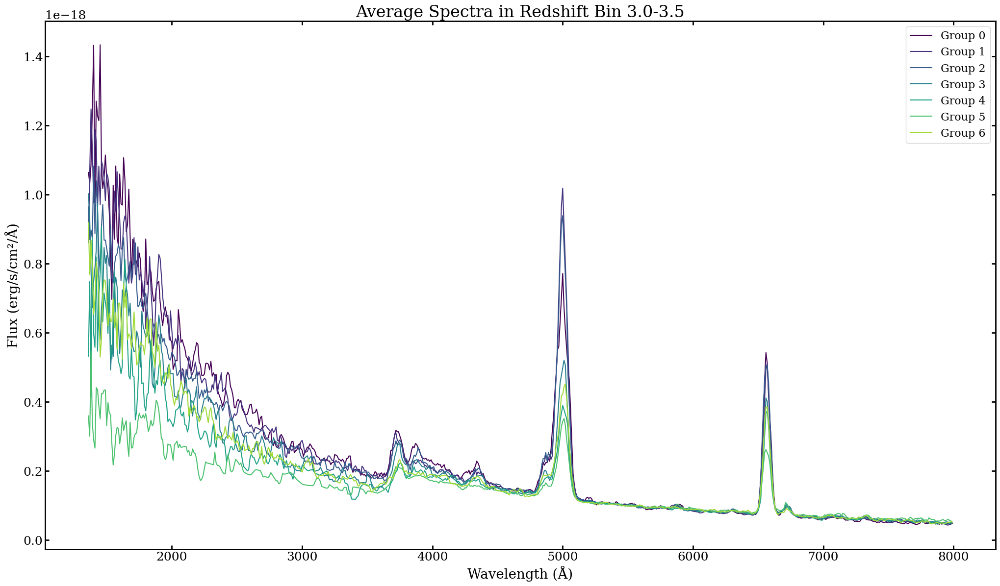

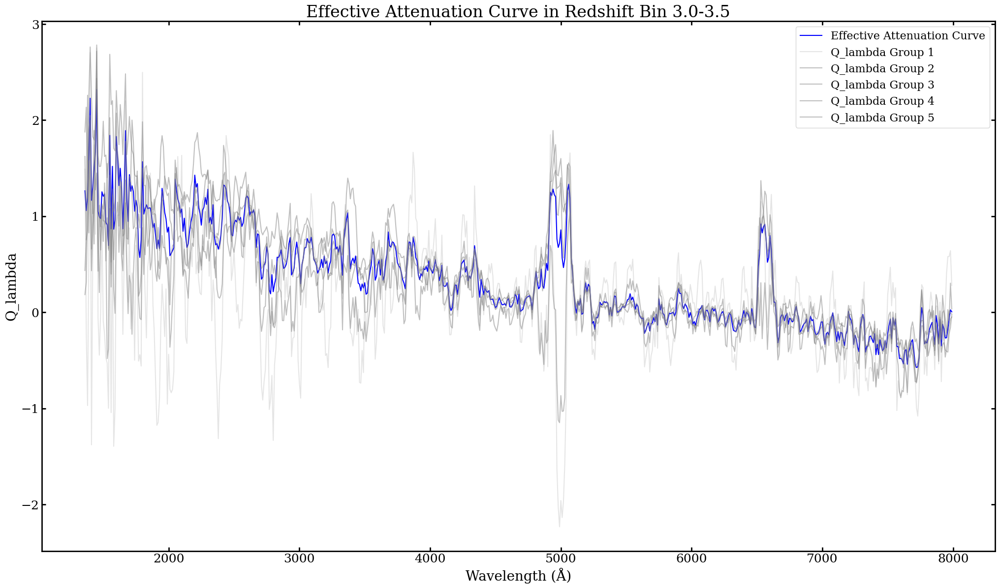

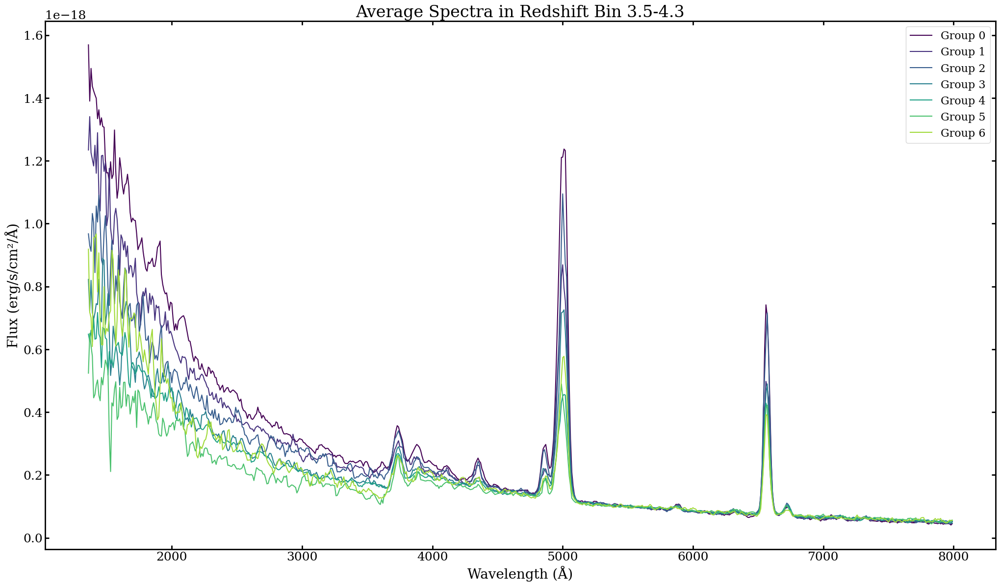

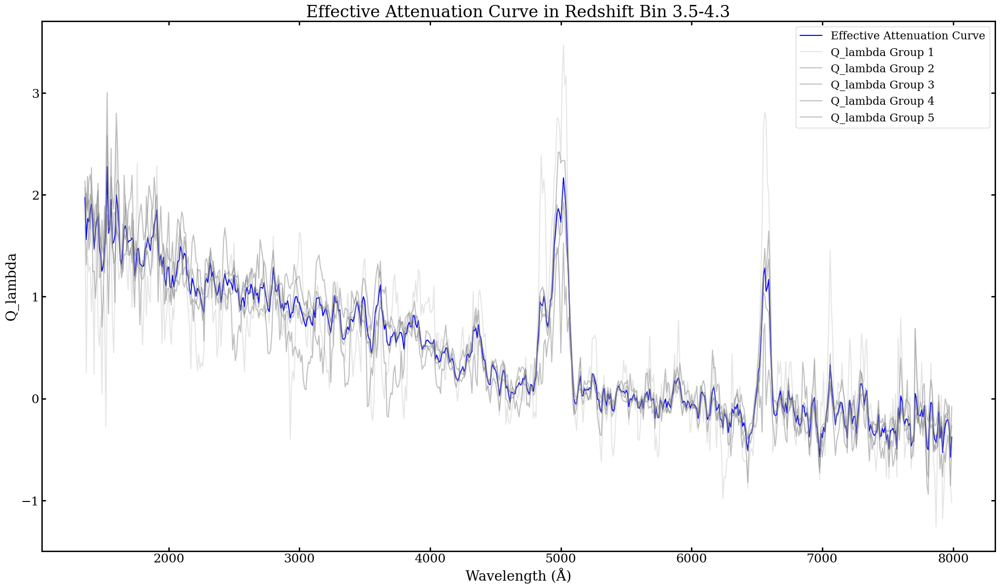

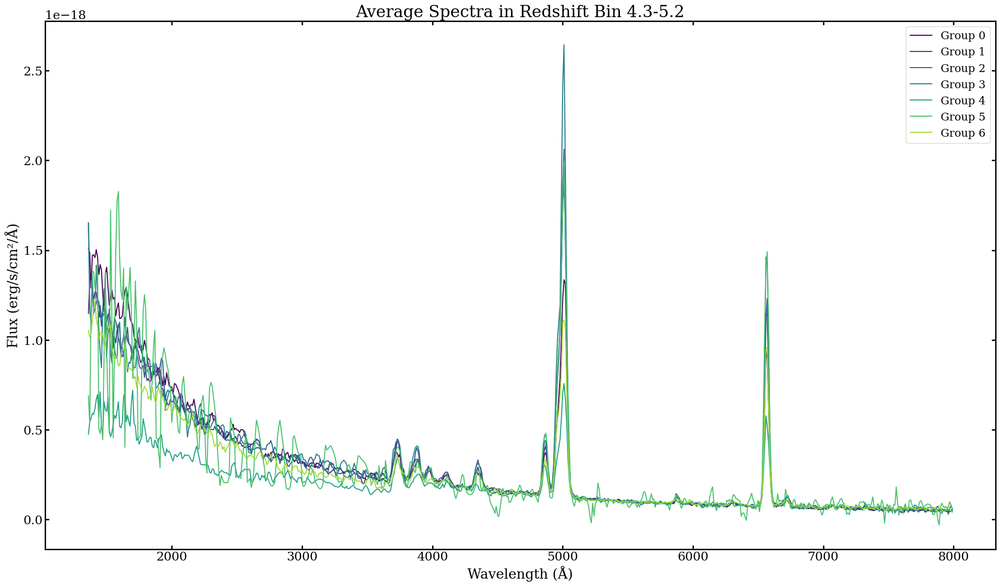

...

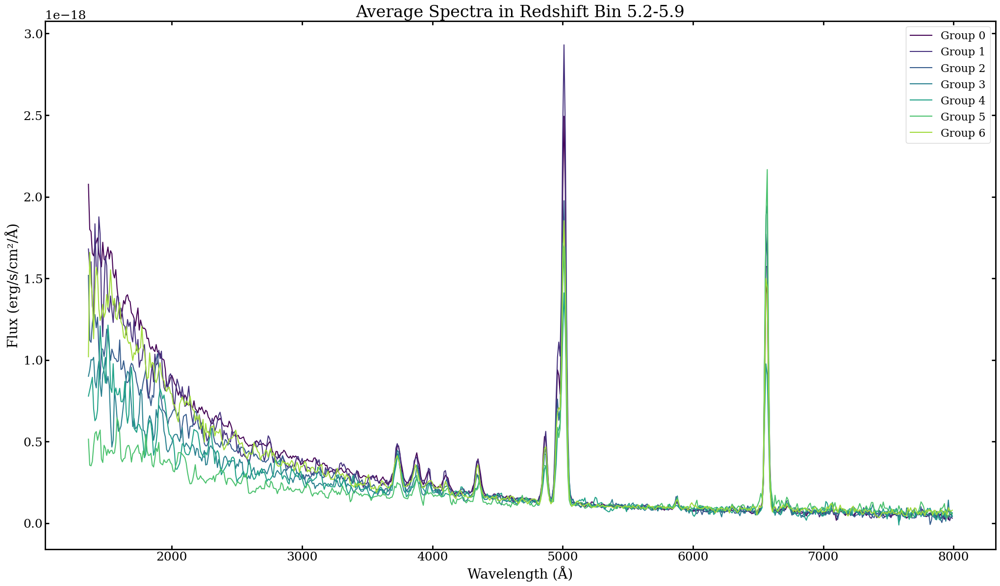

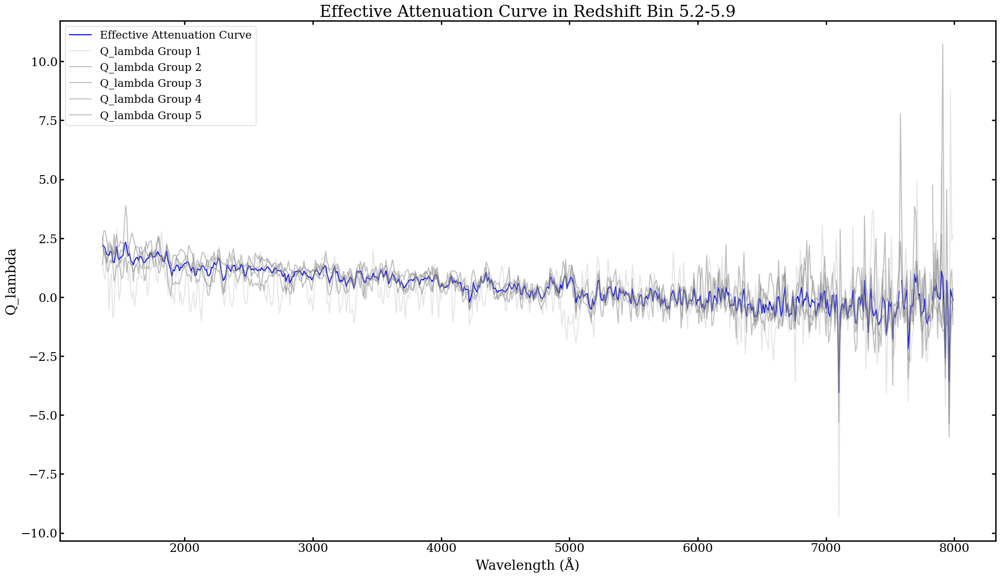

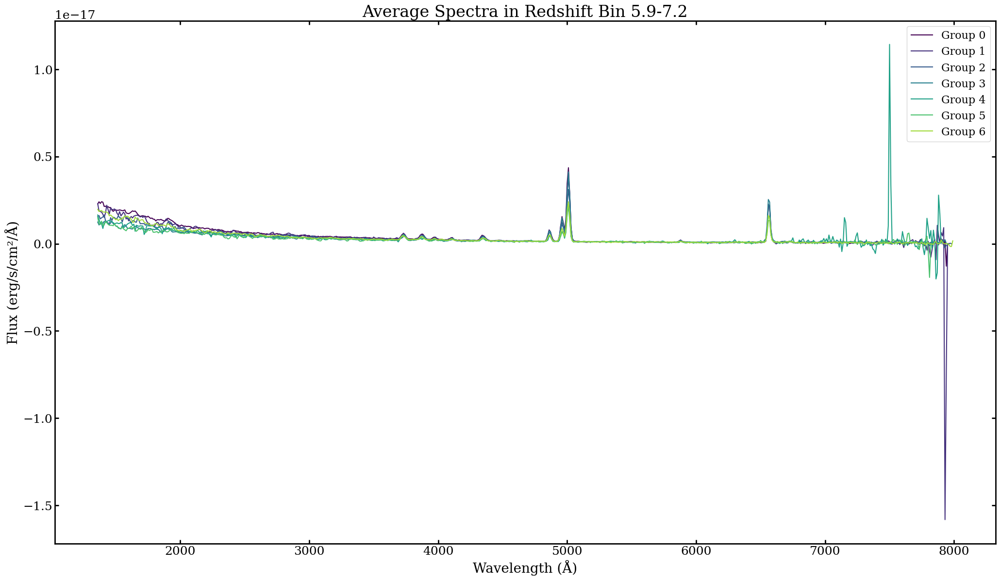

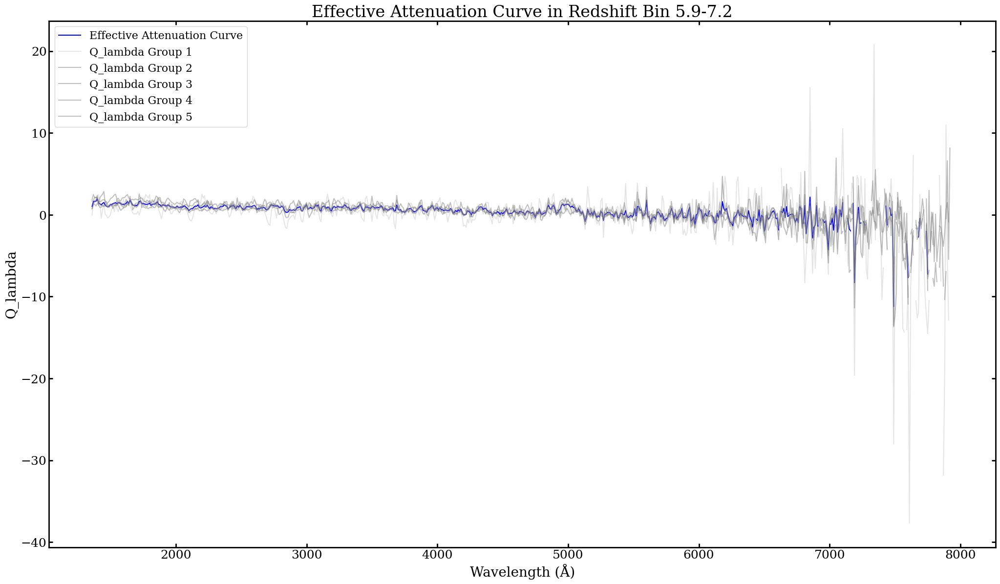

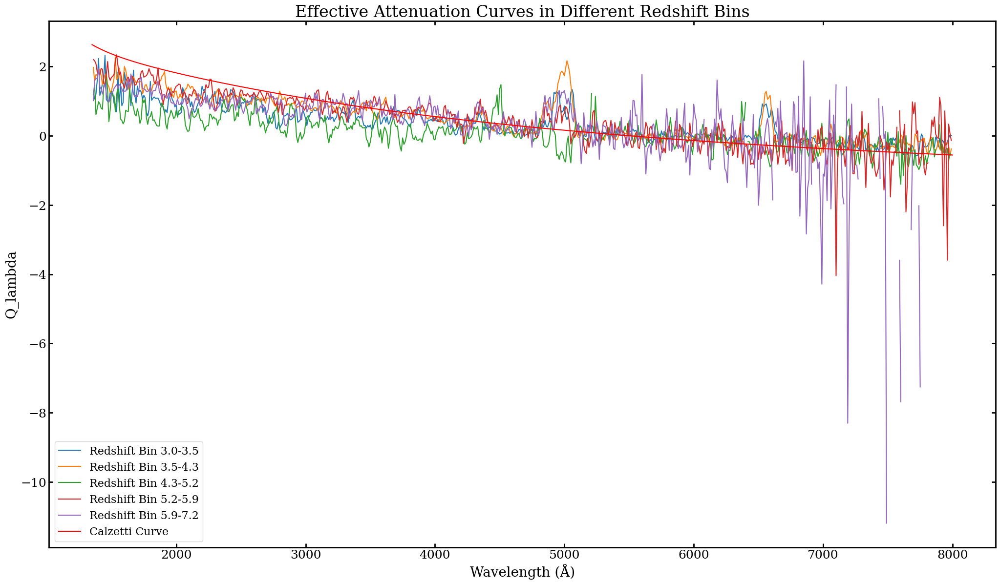

In [26]:
effective_attenuation_curve_list=[]
for redshift_bin_index in range(len(redshift_conditions)):

    group0_averager=FL.SpectrumAverager()
    group1_averager=FL.SpectrumAverager()
    group2_averager=FL.SpectrumAverager()
    group3_averager=FL.SpectrumAverager()
    group4_averager=FL.SpectrumAverager()
    group5_averager=FL.SpectrumAverager()
    group6_averager=FL.SpectrumAverager()


    for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
        if not catalog['sample_flag']:
            continue
        redshift_bin_id=redshift_condition_func(catalog['determined_redshift'],redshift_conditions=redshift_conditions)
        if redshift_bin_id != redshift_bin_index:
            continue

        uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
        halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
        hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
        balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
        group_index=group_condition_func(balmer_decrement)
        if group_index==-1:
            continue

        averager_to_use='group'+str(group_index)+'_averager'
        globals()[averager_to_use].load_spectrum_catalog([surveyid_subid],DJAv4Catalog)

    invalid_averager=np.zeros(7, dtype=bool)

    for i in range(7):
        try:
            averager_to_use='group'+str(i)+'_averager'
            globals()[averager_to_use].create_common_wavelength_grid(wavelength_range=(1350,8000),grid_size=10)
            globals()[averager_to_use].interpolate_spectra(interpolation_method='linear')
            globals()[averager_to_use].spectrum_normalization_within_range(wavelength_range=(5250,5750),target_flux=1e-19)
            globals()[averager_to_use].compute_average_spectrum(method='median', ignore_nan=True, use_percentile_filter=True, lower_percentile=16, upper_percentile=84)
            # globals()[averager_to_use].plot_average_spectrum(show_individual=True, show_average=True, show_error=True, figsize=(25,14), alpha=0.3, show_normalization_point=True, reference_wavelength=5500.0)
            invalid_averager[i]=False

        except Exception as e:
            print(f'Warning: Unable to compute average spectrum for Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}, Group {i}. Skipping this group.')
            invalid_averager[i]=True

    group_decrement_list=[]

    for i in range(6):
        decrement_list=[]

        for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
            if not catalog['sample_flag']:
                continue

            uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
            halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
            hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
            balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
            group_index=group_condition_func(balmer_decrement)
            if group_index!=i:
                continue
            if group_index==-1:
                continue

            decrement_list.append(balmer_decrement)

        group_decrement_list.append(np.mean(decrement_list))

    model_spectra=group0_averager.average_flux*u.erg/u.s/u.cm**2/u.AA
    tau_lambda_list=[]
    Q_lambda_list=[]

    for i in range(1,6):
        if invalid_averager[i]:
            Q_lambda_list.append(np.zeros_like(group0_averager.common_wavelength))
            continue
        averager_to_use='group'+str(i)+'_averager'
        tau_lambda_list=[]
        groupi_averager=globals()[averager_to_use]
        tau_lambda=-np.log( (groupi_averager.average_flux)/(group0_averager.average_flux) )
        tau_lambda_list.append(tau_lambda)
        Q_lambda=tau_lambda/ (group_decrement_list[i]-group_decrement_list[0])
        Q_lambda_list.append(Q_lambda)


    fig, ax=plt.subplots(figsize=(25,14))
    colors=plt.cm.viridis(np.linspace(0,7))
    for i in range(7):
        if invalid_averager[i]:
            continue
        averager_to_use='group'+str(i)+'_averager'
        averager=globals()[averager_to_use]
        ax.plot(averager.common_wavelength, averager.average_flux, color=colors[i], label='Group '+str(i))
    ax.set_xlabel('Wavelength (Å)', fontsize=20)
    ax.set_ylabel('Flux (erg/s/cm²/Å)', fontsize=20)
    ax.set_title(f'Average Spectra in Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=24)
    ax.legend(fontsize=16)
    plt.show()


    Q_lambda_array=np.array(Q_lambda_list)

    valid_weights = []
    for i in range(1,6):
        if not invalid_averager[i]:
            valid_weights.append(group_decrement_list[i]-group_decrement_list[0])

    effective_attenuation_curve=np.average(Q_lambda_array[~np.array(invalid_averager[1:-1])], axis=0, weights=valid_weights)
    fig, ax=plt.subplots(figsize=(25,14))
    averager=group1_averager
    ax.plot(averager.common_wavelength, effective_attenuation_curve, color='blue', label='Effective Attenuation Curve')
    for i in range(0,5):
        if invalid_averager[i+1]:
            continue
        Q_lambda=Q_lambda_list[i]
        averager_to_use='group'+str(i+1)+'_averager'
        averager=globals()[averager_to_use]
        ax.plot(averager.common_wavelength, Q_lambda, color='gray', alpha=0.5 if i!=0 else 0.2, label='Q_lambda Group '+str(i+1))
    plt.xlabel('Wavelength (Å)', fontsize=20)
    plt.ylabel('Q_lambda', fontsize=20)
    plt.title('Effective Attenuation Curve in Redshift Bin '+f'{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=24)
    plt.legend(fontsize=16)
    plt.show()
    effective_attenuation_curve_list.append((averager.common_wavelength, effective_attenuation_curve))


colors=sns.color_palette( n_colors=len(redshift_conditions))

calzetti_curve=Calzetti((averager.common_wavelength*u.AA).to(u.micron).value)
fig, ax=plt.subplots(figsize=(25,14))
for redshift_bin_index in range(len(redshift_conditions)):
    common_wavelength, effective_attenuation_curve=effective_attenuation_curve_list[redshift_bin_index]
    ax.plot(common_wavelength, effective_attenuation_curve, label='Redshift Bin '+f'{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', color=colors[redshift_bin_index])

ax.plot(averager.common_wavelength, calzetti_curve, color='red', label='Calzetti Curve')
plt.xlabel('Wavelength (Å)', fontsize=20)
plt.ylabel('Q_lambda', fontsize=20)
plt.title('Effective Attenuation Curves in Different Redshift Bins', fontsize=24)
plt.legend(fontsize=16)
plt.show()

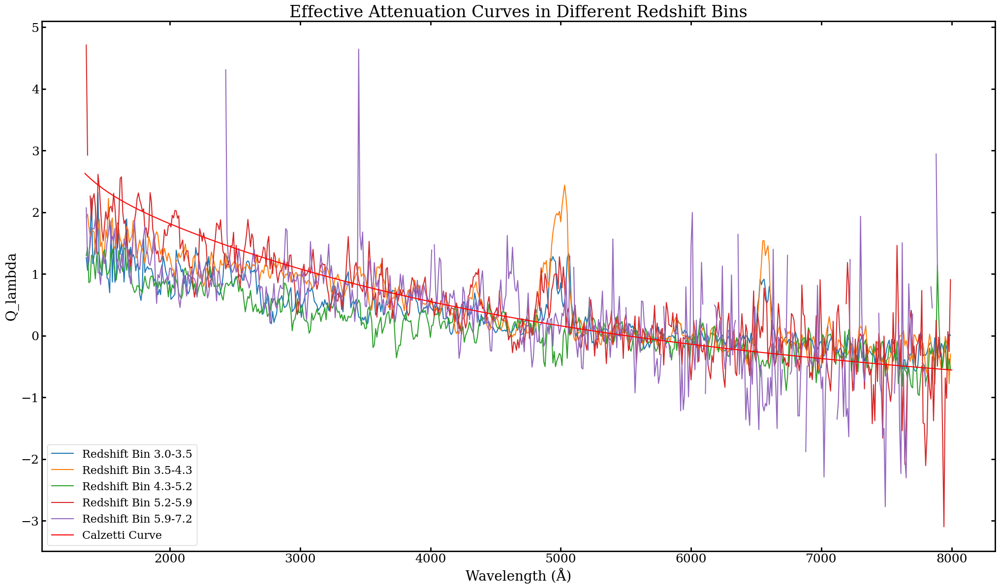

In [40]:
fig, ax=plt.subplots(figsize=(25,14))
for redshift_bin_index in range(len(redshift_conditions)):
    common_wavelength, effective_attenuation_curve=effective_attenuation_curve_list[redshift_bin_index]
    ax.plot(common_wavelength, effective_attenuation_curve, label='Redshift Bin '+f'{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', color=colors[redshift_bin_index])

ax.plot(averager.common_wavelength, calzetti_curve, color='red', label='Calzetti Curve')
plt.xlabel('Wavelength (Å)', fontsize=20)
plt.ylabel('Q_lambda', fontsize=20)
plt.title('Effective Attenuation Curves in Different Redshift Bins', fontsize=24)
plt.legend(fontsize=16)
plt.savefig('Redshift_Binned_Effective_Attenuation_Curves.pdf', bbox_inches='tight')
plt.show()

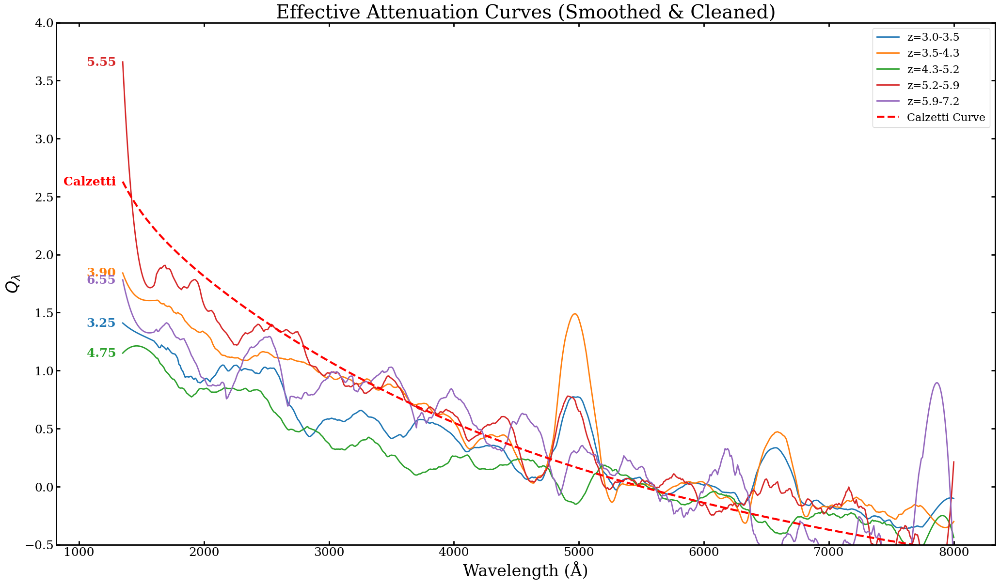

In [41]:
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import numpy as np
import pandas as pd

fig, ax = plt.subplots(figsize=(25, 14))

# 平滑参数
window_len = 51
poly_order = 3

for redshift_bin_index in range(len(redshift_conditions)):
    common_wavelength, effective_attenuation_curve = effective_attenuation_curve_list[redshift_bin_index]

    # --- 数据清洗与插值 ---
    series_curve = pd.Series(effective_attenuation_curve)
    curve_clean = series_curve.replace([np.inf, -np.inf], np.nan).interpolate(method='linear', limit_direction='both')
    curve_clean = curve_clean.to_numpy()

    if np.isnan(curve_clean).all():
        continue

    # --- 数据平滑 ---
    try:
        current_window_len = window_len
        if len(curve_clean) < window_len:
            current_window_len = len(curve_clean) if len(curve_clean) % 2 != 0 else len(curve_clean) - 1

        if current_window_len < poly_order + 2:
             smoothed_curve = curve_clean
        else:
             smoothed_curve = savgol_filter(curve_clean, window_length=current_window_len, polyorder=poly_order)

        # --- 绘图 ---
        line_color = colors[redshift_bin_index] # 获取当前颜色
        z_min, z_max = redshift_conditions[redshift_bin_index]
        label_text = f'z={z_min}-{z_max}' # 图例标签

        ax.plot(common_wavelength, smoothed_curve,
                label=label_text,
                color=line_color, linewidth=2)

        # --- 新增功能：在左侧标注红移中心 ---
        # 1. 计算红移中心
        z_center = (z_min + z_max) / 2

        # 2. 找到第一个有效数据点的位置（通常是索引0，但为了保险起见）
        # 这里直接取 index 0，因为 interpolate(limit_direction='both') 保证了开头有值
        x_start = common_wavelength[0]
        y_start = smoothed_curve[0]

        # 3. 使用 annotate 添加文本
        ax.annotate(f'{z_center:.2f}',               # 显示的文本 (保留2位小数)
                    xy=(x_start, y_start),           # 标注的数据点坐标
                    xytext=(-10, 0),                 # 文本偏移量：向左偏 10 个点，上下不偏
                    textcoords='offset points',      # 偏移量单位
                    ha='right',                      # 水平对齐：右对齐（文本尾部对着数据点）
                    va='center',                     # 垂直对齐：居中
                    color=line_color,                # 文本颜色与曲线一致
                    fontsize=18,                     # 字体大小
                    fontweight='bold')               # 字体加粗

    except Exception as e:
        print(f"Skipping bin {redshift_bin_index} due to error: {e}")
        # 出错时的兜底绘制
        ax.plot(common_wavelength, effective_attenuation_curve,
                label='Redshift Bin (Raw)', color=colors[redshift_bin_index], alpha=0.5)

# 绘制 Calzetti Curve
ax.plot(averager.common_wavelength, calzetti_curve, color='red', label='Calzetti Curve', linewidth=3, linestyle='--')
# 给 Calzetti 也加个标注 (可选)
ax.annotate('Calzetti',
            xy=(averager.common_wavelength[0], calzetti_curve[0]),
            xytext=(-10, 0), textcoords='offset points',
            ha='right', va='center', color='red', fontsize=18, fontweight='bold')

plt.xlabel('Wavelength (Å)', fontsize=24)
plt.ylabel(r'$Q_\lambda$', fontsize=24) # 支持 LaTeX 格式
plt.ylim(-0.5, 4)
plt.title('Effective Attenuation Curves (Smoothed & Cleaned)', fontsize=28)
plt.legend(fontsize=16)

# 稍微扩展 x 轴的左侧范围，给文字留出空间，防止文字被切掉
current_xlim = ax.get_xlim()
ax.set_xlim(current_xlim[0] - 200, current_xlim[1])
plt.savefig('Redshift_Binned_Effective_Attenuation_Curves_Smoothed_Labeled.pdf', bbox_inches='tight')
plt.show()

---
# we can see that the high redshift bins contribute more to the average dust attenuation curve

Text(0.5, 1.0, 'Redshift Distribution of Sample Galaxies')

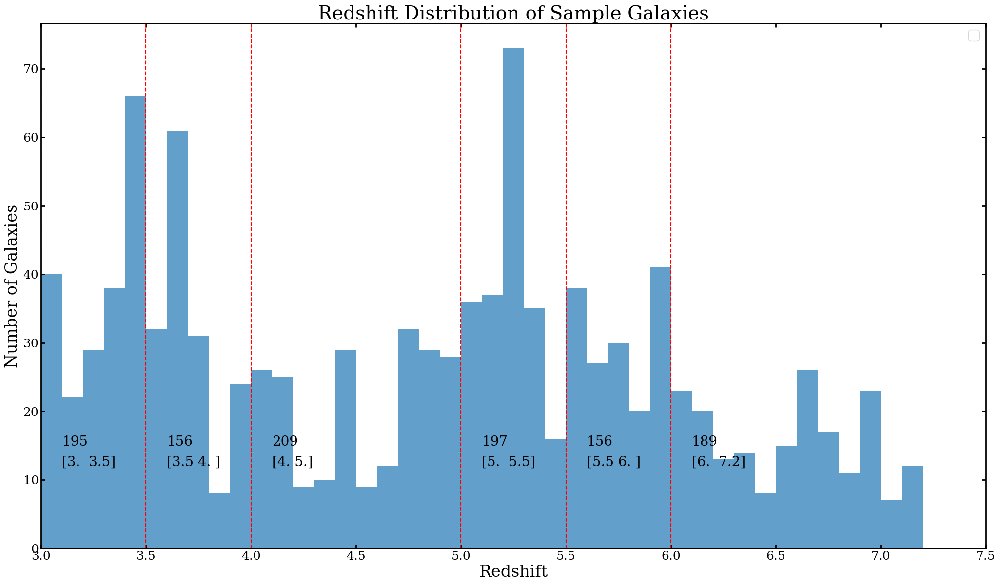

In [28]:
redshift_conditions=np.array([[3,3.5],[3.5,4.0],[4.0,5.0],[5.0,5.5],[5.5,6],[6,7.2]])
fig, ax=plt.subplots(figsize=(25,14))
def redshift_condition_func(z,redshift_conditions=redshift_conditions):
    for i, condition in enumerate(redshift_conditions):
        if condition[0]<=z<condition[1]:
            return i

ax.hist(redshift_list, bins=50,range=(3,8), alpha=0.7)
ax.set_xlabel('Redshift',fontsize=24)
ax.set_ylabel('Number of Galaxies',fontsize=24)

ax.spines['bottom'].set_linewidth(2)
ax.spines['top'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['right'].set_color('black')
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.xaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
ax.yaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
ax.xaxis.set_tick_params(length=6, which='major')
ax.xaxis.set_tick_params(length=3, which='minor')
ax.yaxis.set_tick_params(length=6, which='major')
ax.yaxis.set_tick_params(length=3, which='minor')
ax.legend(fontsize=20, loc='best')
ax.set_xlim(3,7.5)
for bin_edge in redshift_conditions:
    ax.axvline(bin_edge[0], color='r', linestyle='dashed')
    ax.text(bin_edge[0]+0.1, 15, f'{np.sum((redshift_list >= bin_edge[0]) & (redshift_list < bin_edge[1]))}', color='k', fontsize=20)
    ax.text(bin_edge[0]+0.1, 12, f'{bin_edge}', color='k', fontsize=20)
ax.set_title('Redshift Distribution of Sample Galaxies', fontsize=28)

Spectrum index 5 has invalid normalization factor. Skipping.


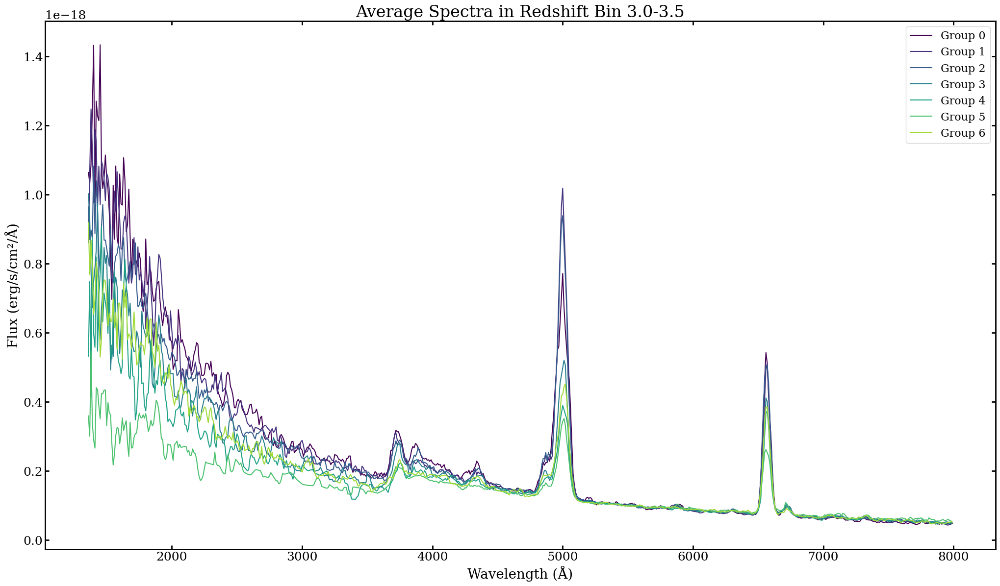

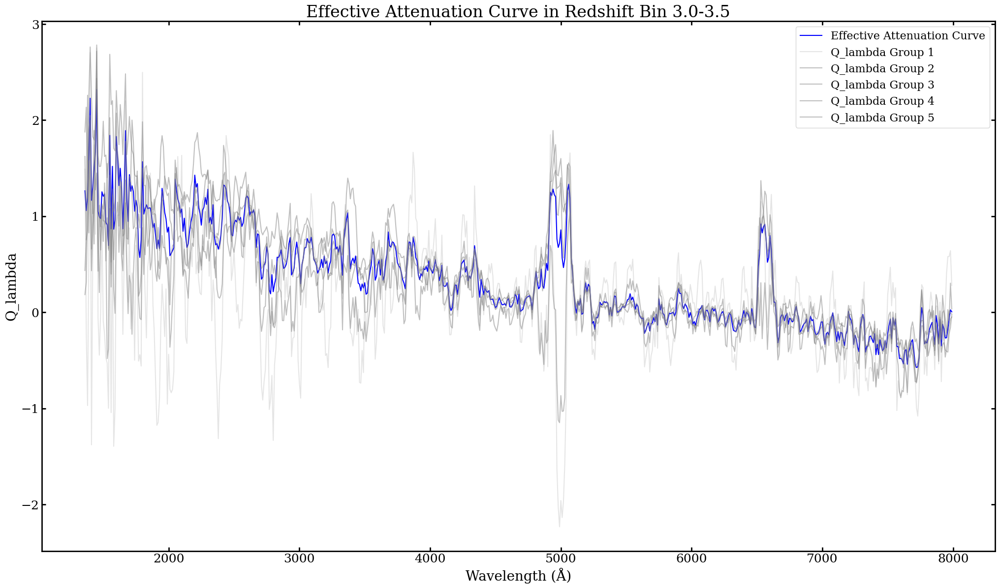

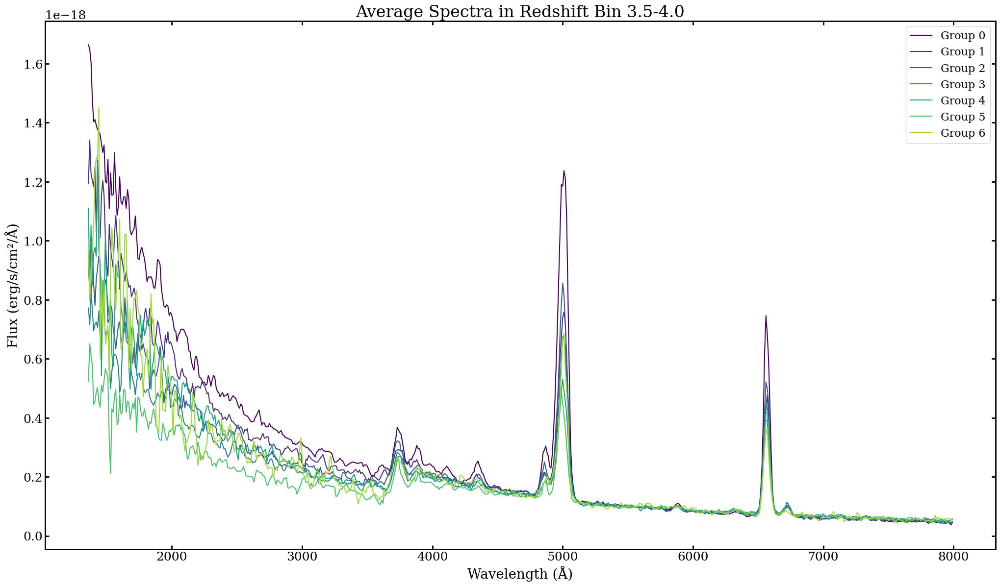

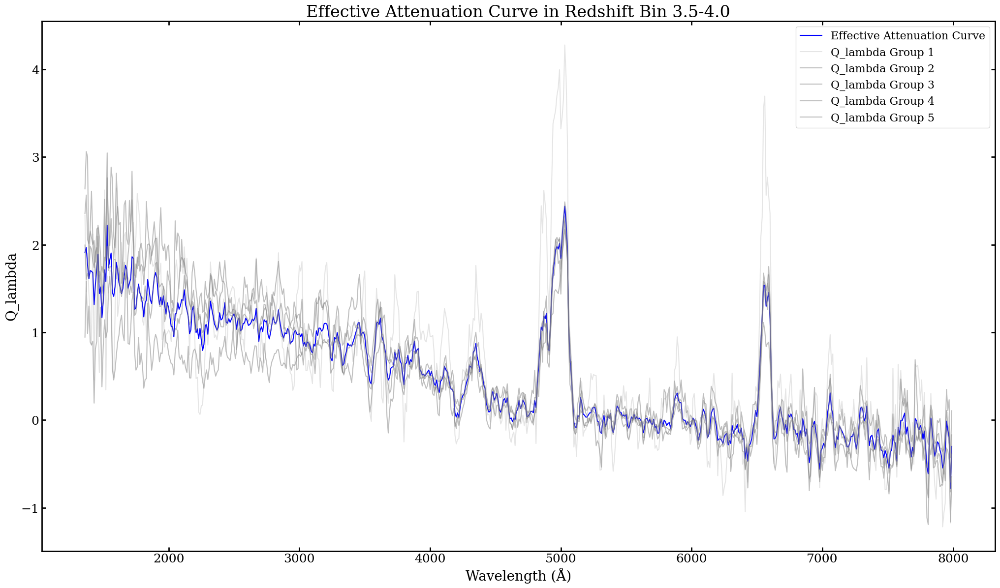

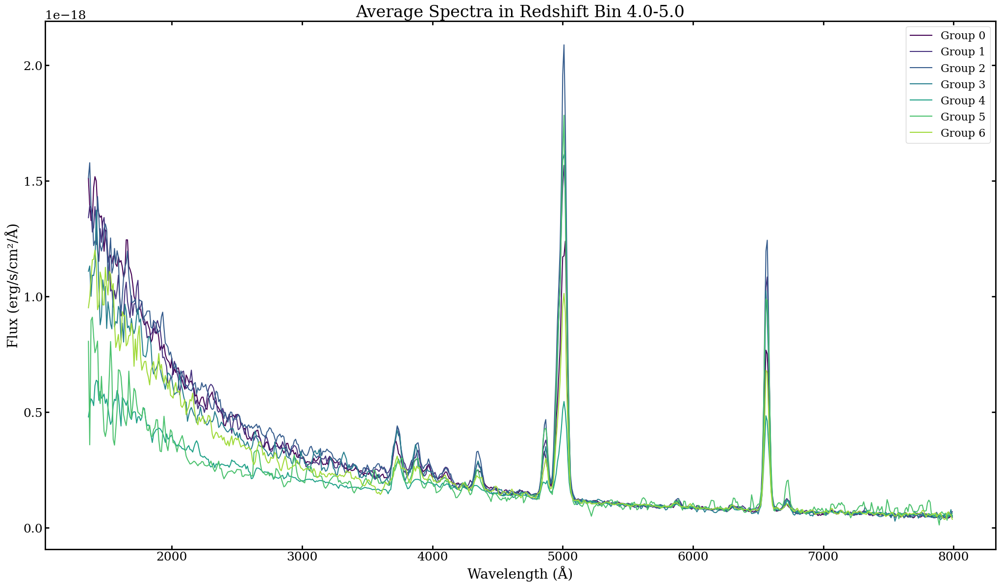

...

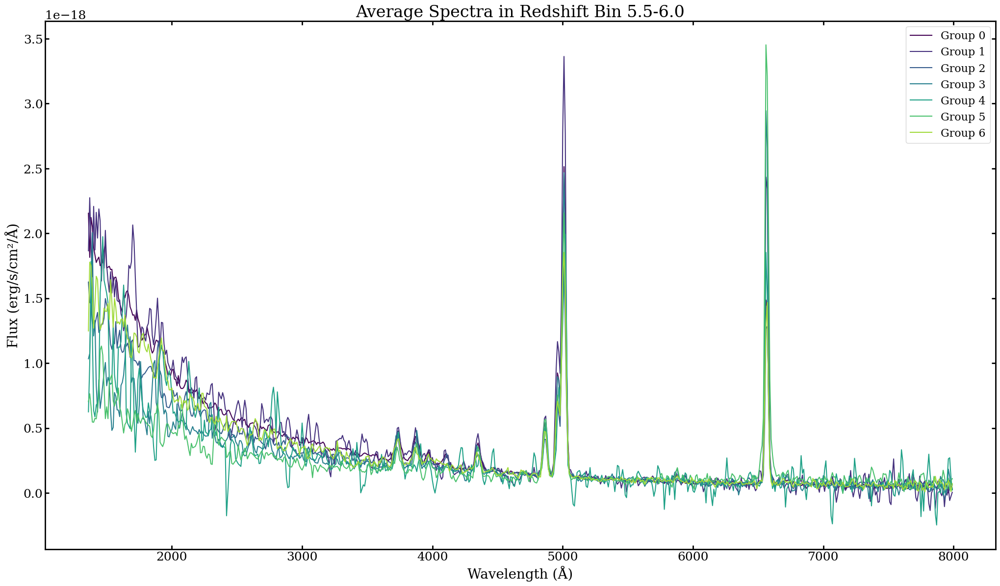

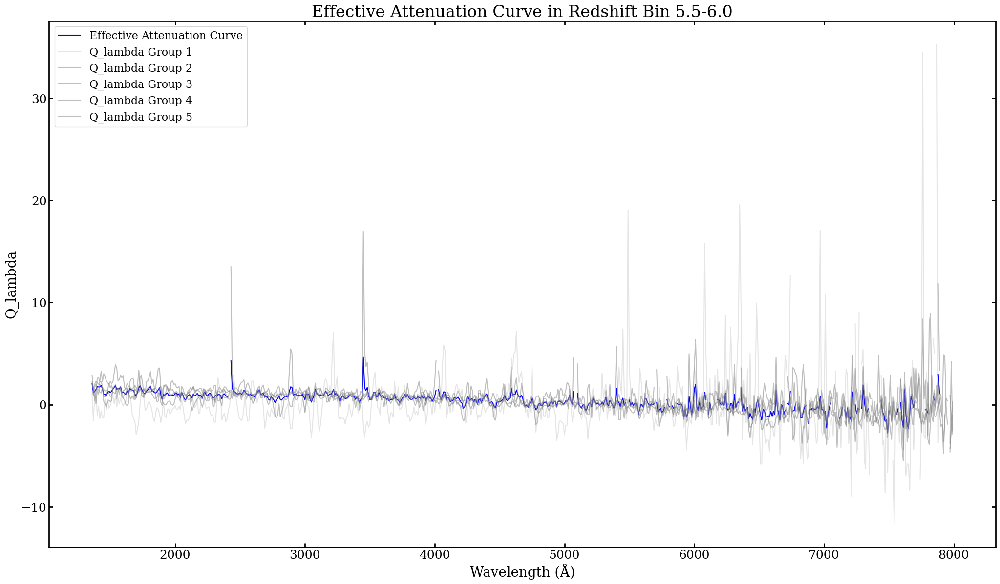

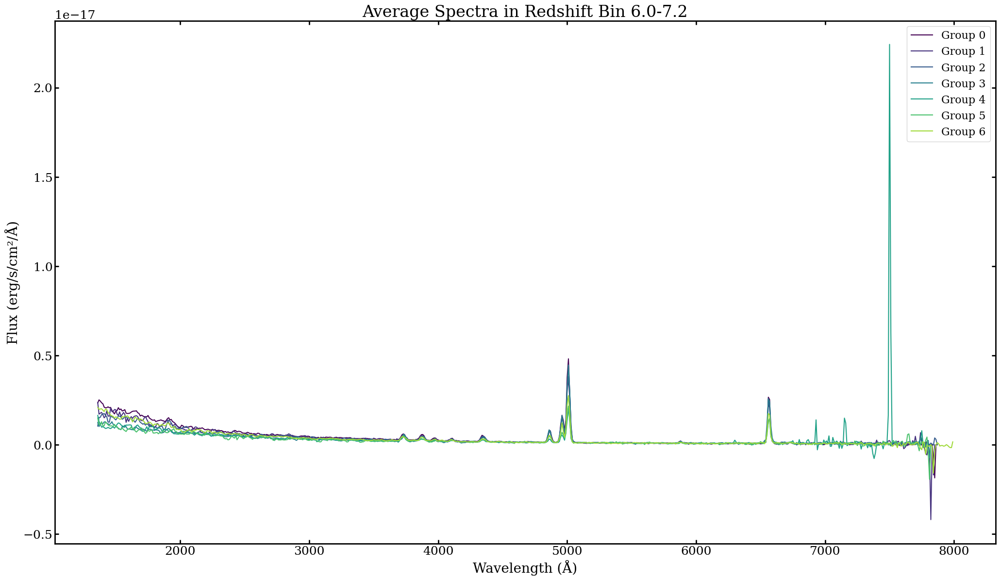

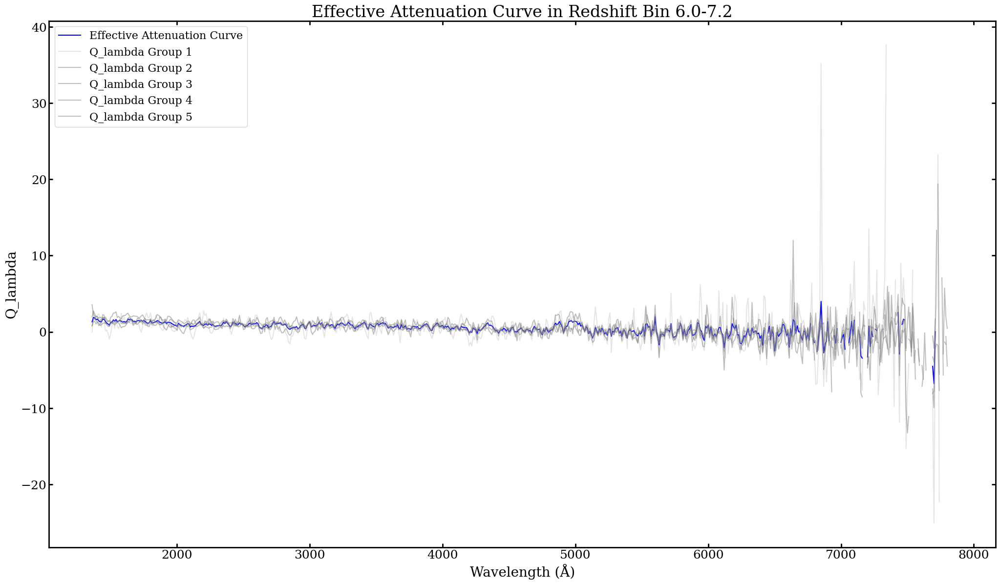

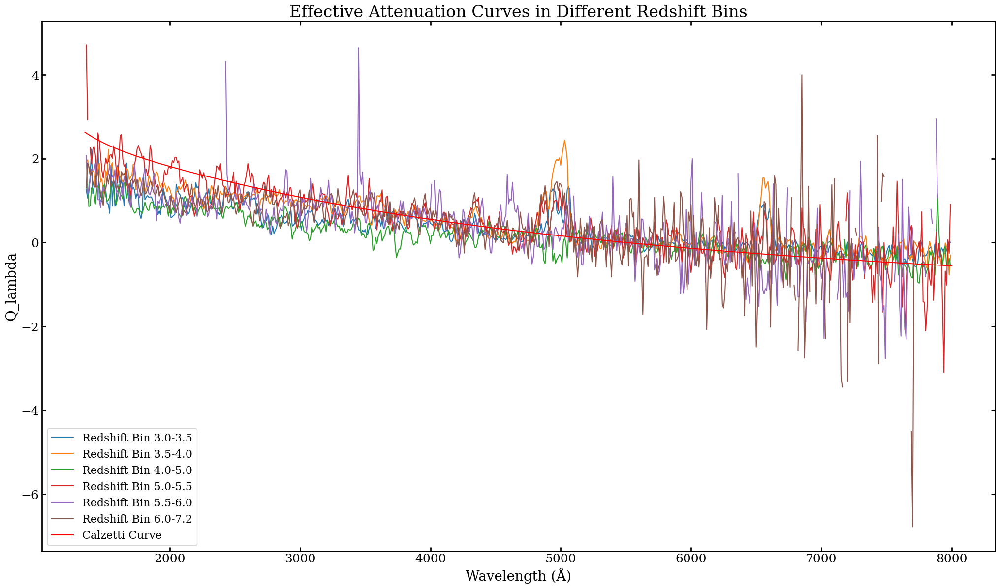

In [30]:
effective_attenuation_curve_list=[]
for redshift_bin_index in range(len(redshift_conditions)):

    group0_averager=FL.SpectrumAverager()
    group1_averager=FL.SpectrumAverager()
    group2_averager=FL.SpectrumAverager()
    group3_averager=FL.SpectrumAverager()
    group4_averager=FL.SpectrumAverager()
    group5_averager=FL.SpectrumAverager()
    group6_averager=FL.SpectrumAverager()


    for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
        if not catalog['sample_flag']:
            continue
        redshift_bin_id=redshift_condition_func(catalog['determined_redshift'],redshift_conditions=redshift_conditions)
        if redshift_bin_id != redshift_bin_index:
            continue

        uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
        halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
        hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
        balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
        group_index=group_condition_func(balmer_decrement)
        if group_index==-1:
            continue

        averager_to_use='group'+str(group_index)+'_averager'
        globals()[averager_to_use].load_spectrum_catalog([surveyid_subid],DJAv4Catalog)

    invalid_averager=np.zeros(7, dtype=bool)

    for i in range(7):
        try:
            averager_to_use='group'+str(i)+'_averager'
            globals()[averager_to_use].create_common_wavelength_grid(wavelength_range=(1350,8000),grid_size=10)
            globals()[averager_to_use].interpolate_spectra(interpolation_method='linear')
            globals()[averager_to_use].spectrum_normalization_within_range(wavelength_range=(5250,5750),target_flux=1e-19)
            globals()[averager_to_use].compute_average_spectrum(method='median', ignore_nan=True, use_percentile_filter=True, lower_percentile=16, upper_percentile=84)
            # globals()[averager_to_use].plot_average_spectrum(show_individual=True, show_average=True, show_error=True, figsize=(25,14), alpha=0.3, show_normalization_point=True, reference_wavelength=5500.0)
            invalid_averager[i]=False

        except Exception as e:
            print(f'Warning: Unable to compute average spectrum for Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}, Group {i}. Skipping this group.')
            invalid_averager[i]=True

    group_decrement_list=[]

    for i in range(6):
        decrement_list=[]

        for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
            if not catalog['sample_flag']:
                continue

            uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
            halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
            hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
            balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
            group_index=group_condition_func(balmer_decrement)
            if group_index!=i:
                continue
            if group_index==-1:
                continue

            decrement_list.append(balmer_decrement)

        group_decrement_list.append(np.mean(decrement_list))

    model_spectra=group0_averager.average_flux*u.erg/u.s/u.cm**2/u.AA
    tau_lambda_list=[]
    Q_lambda_list=[]

    for i in range(1,6):
        if invalid_averager[i]:
            Q_lambda_list.append(np.zeros_like(group0_averager.common_wavelength))
            continue
        averager_to_use='group'+str(i)+'_averager'
        tau_lambda_list=[]
        groupi_averager=globals()[averager_to_use]
        tau_lambda=-np.log( (groupi_averager.average_flux)/(group0_averager.average_flux) )
        tau_lambda_list.append(tau_lambda)
        Q_lambda=tau_lambda/ (group_decrement_list[i]-group_decrement_list[0])
        Q_lambda_list.append(Q_lambda)


    fig, ax=plt.subplots(figsize=(25,14))
    colors=plt.cm.viridis(np.linspace(0,7))
    for i in range(7):
        if invalid_averager[i]:
            continue
        averager_to_use='group'+str(i)+'_averager'
        averager=globals()[averager_to_use]
        ax.plot(averager.common_wavelength, averager.average_flux, color=colors[i], label='Group '+str(i))
    ax.set_xlabel('Wavelength (Å)', fontsize=20)
    ax.set_ylabel('Flux (erg/s/cm²/Å)', fontsize=20)
    ax.set_title(f'Average Spectra in Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=24)
    ax.legend(fontsize=16)
    plt.show()


    Q_lambda_array=np.array(Q_lambda_list)

    valid_weights = []
    for i in range(1,6):
        if not invalid_averager[i]:
            valid_weights.append(group_decrement_list[i]-group_decrement_list[0])

    effective_attenuation_curve=np.average(Q_lambda_array[~np.array(invalid_averager[1:-1])], axis=0, weights=valid_weights)
    fig, ax=plt.subplots(figsize=(25,14))
    averager=group1_averager
    ax.plot(averager.common_wavelength, effective_attenuation_curve, color='blue', label='Effective Attenuation Curve')
    for i in range(0,5):
        if invalid_averager[i+1]:
            continue
        Q_lambda=Q_lambda_list[i]
        averager_to_use='group'+str(i+1)+'_averager'
        averager=globals()[averager_to_use]
        ax.plot(averager.common_wavelength, Q_lambda, color='gray', alpha=0.5 if i!=0 else 0.2, label='Q_lambda Group '+str(i+1))
    plt.xlabel('Wavelength (Å)', fontsize=20)
    plt.ylabel('Q_lambda', fontsize=20)
    plt.title('Effective Attenuation Curve in Redshift Bin '+f'{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=24)
    plt.legend(fontsize=16)
    plt.show()
    effective_attenuation_curve_list.append((averager.common_wavelength, effective_attenuation_curve))


colors=sns.color_palette( n_colors=len(redshift_conditions))

calzetti_curve=Calzetti((averager.common_wavelength*u.AA).to(u.micron).value)
fig, ax=plt.subplots(figsize=(25,14))
for redshift_bin_index in range(len(redshift_conditions)):
    common_wavelength, effective_attenuation_curve=effective_attenuation_curve_list[redshift_bin_index]
    ax.plot(common_wavelength, effective_attenuation_curve, label='Redshift Bin '+f'{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', color=colors[redshift_bin_index])

ax.plot(averager.common_wavelength, calzetti_curve, color='red', label='Calzetti Curve')
plt.xlabel('Wavelength (Å)', fontsize=20)
plt.ylabel('Q_lambda', fontsize=20)
plt.title('Effective Attenuation Curves in Different Redshift Bins', fontsize=24)
plt.legend(fontsize=16)
plt.show()

Text(0.5, 1.0, 'Redshift Distribution of Sample Galaxies')

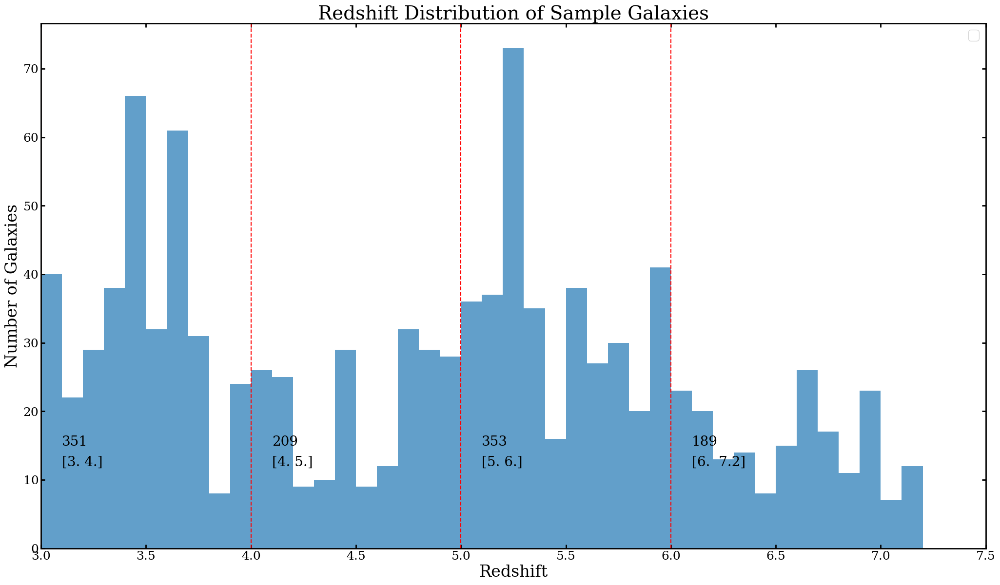

In [ ]:
redshift_conditions=np.array([[3,4],[4,5.0],[5.,6],[6,7.2]])
fig, ax=plt.subplots(figsize=(25,14))
def redshift_condition_func(z,redshift_conditions=redshift_conditions):
    for i, condition in enumerate(redshift_conditions):
        if condition[0]<=z<condition[1]:
            return i

ax.hist(redshift_list, bins=50,range=(3,8), alpha=0.7)
ax.set_xlabel('Redshift',fontsize=24)
ax.set_ylabel('Number of Galaxies',fontsize=24)

ax.spines['bottom'].set_linewidth(2)
ax.spines['top'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['right'].set_color('black')
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.xaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
ax.yaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
ax.xaxis.set_tick_params(length=6, which='major')
ax.xaxis.set_tick_params(length=3, which='minor')
ax.yaxis.set_tick_params(length=6, which='major')
ax.yaxis.set_tick_params(length=3, which='minor')
ax.legend(fontsize=20, loc='best')
ax.set_xlim(3,7.5)
for bin_edge in redshift_conditions:
    ax.axvline(bin_edge[0], color='r', linestyle='dashed')
    ax.text(bin_edge[0]+0.1, 15, f'{np.sum((redshift_list >= bin_edge[0]) & (redshift_list < bin_edge[1]))}', color='k', fontsize=20)
    ax.text(bin_edge[0]+0.1, 12, f'{bin_edge}', color='k', fontsize=20)
ax.set_title('Redshift Distribution of Sample Galaxies', fontsize=28)
plt.show()


for redshift_bin_index in range(len(redshift_conditions)):
    balmer_decrement_list=[]
    beta_list=[]
    alpha_list=[]

    for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
        if not catalog['sample_flag']:
            continue
        redshift_bin_id=redshift_condition_func(catalog['determined_redshift'],redshift_conditions=redshift_conditions)
        if redshift_bin_id != redshift_bin_index:
            alpha_list.append(0.2)

        else:
            alpha_list.append(1.0)

        uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
        halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
        hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
        balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
        balmer_decrement_list.append(balmer_decrement)
        beta_list.append(uv_slope_value)

    balmer_decrement_array=np.array(balmer_decrement_list)
    beta_array=np.array(beta_list)
    alpha_array=np.array(alpha_list)

    fig, ax=plt.subplots(figsize=(25,14))
    sc=ax.scatter(balmer_decrement_array, beta_array, alpha=alpha_array, s=100, edgecolors='k', linewidths=0.5)
    ax.set_xlabel('Balmer Decrement ln(Hα/Hβ/2.86)', fontsize=24)
    ax.set_ylabel('UV Continuum Slope β', fontsize=24)
    ax.set_title(f'Balmer Decrement vs UV Slope in Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=28)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.spines['left'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    ax.xaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
    ax.yaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
    ax.xaxis.set_tick_params(length=6, which='major')
    ax.xaxis.set_tick_params(length=3, which='minor')
    ax.yaxis.set_tick_params(length=6, which='major')
    ax.yaxis.set_tick_params(length=3, which='minor')
    ax.set_xlim(-0.2,0.7)
    ax.set_ylim(-3,-0.5)
    # plt.savefig(f'Balmer_Decrement_vs_UV_Slope_Redshift_Bin_{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}.pdf', bbox_inches='tight')









    group_conditions = [(-0.2,0.05),(0.06,0.12), (0.12,0.24),(0.24,0.36),(0.36,0.48),(0.48,0.6)]
    last_point_x=None
    last_point_y=None

    for lower, upper in group_conditions:
        group_mask = (balmer_decrement_array >= lower) & (balmer_decrement_array < upper) & (alpha_array==1.0)
        group_num=np.sum(group_mask)
        if group_num == 0:
            continue
        group_uv_slopes = beta_array[group_mask]

        lower_value=16
        upper_value=100-lower_value


        mask_lower_16_upper_84 = (group_uv_slopes >= np.percentile(group_uv_slopes,lower_value)) & (group_uv_slopes <= np.percentile(group_uv_slopes, upper_value))
        group_uv_slopes = group_uv_slopes[mask_lower_16_upper_84]


        weighted_mean_uv_slope = np.average(group_uv_slopes)

        mid_point = (lower + upper) / 2
        z=30

        ax.scatter(mid_point, weighted_mean_uv_slope,
                    marker='s', color='black', s=144,
                    label=f'Bin [{lower:.2f}, {upper:.2f}] Mean' if lower == group_conditions[0][0] else "", zorder=z)

        if last_point_x is not None and last_point_y is not None:
            ax.plot([last_point_x, mid_point], [last_point_y, weighted_mean_uv_slope], color='black', linewidth=5, zorder=z)
        last_point_x = mid_point
        last_point_y = weighted_mean_uv_slope

        plt.text(mid_point, weighted_mean_uv_slope-0.1, f'N={group_num}', fontsize=20, ha='center',zorder=z,c='black')
    plt.show()


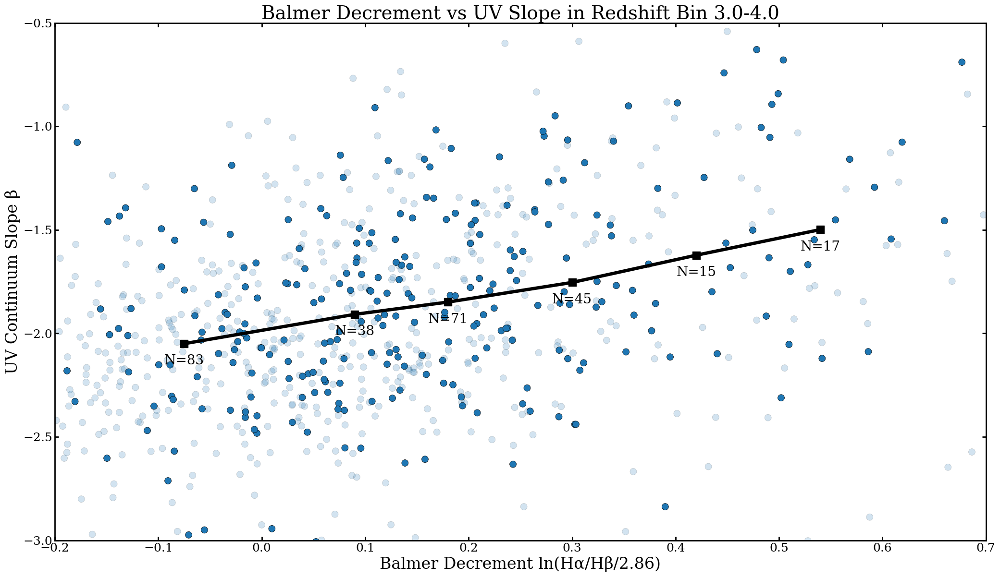

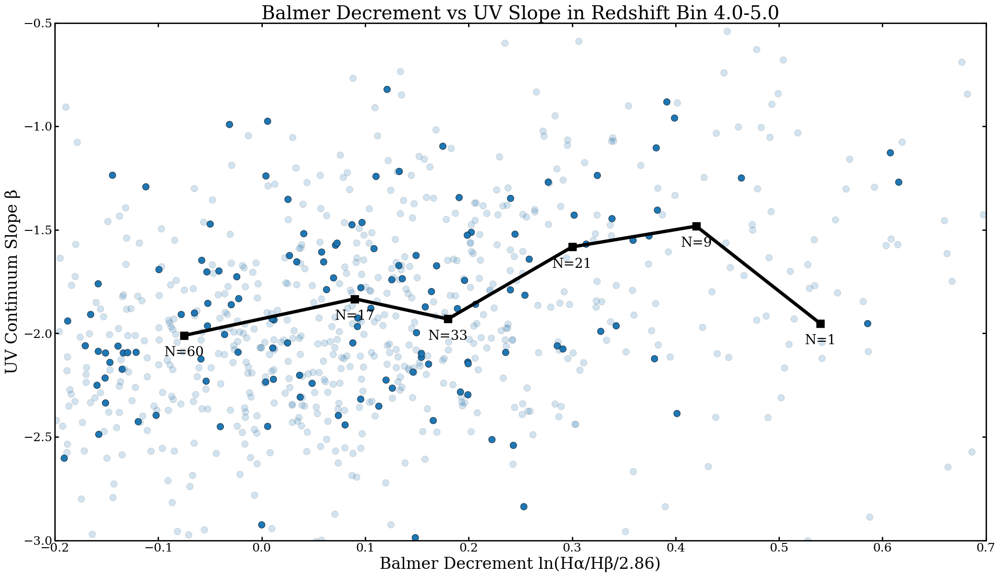

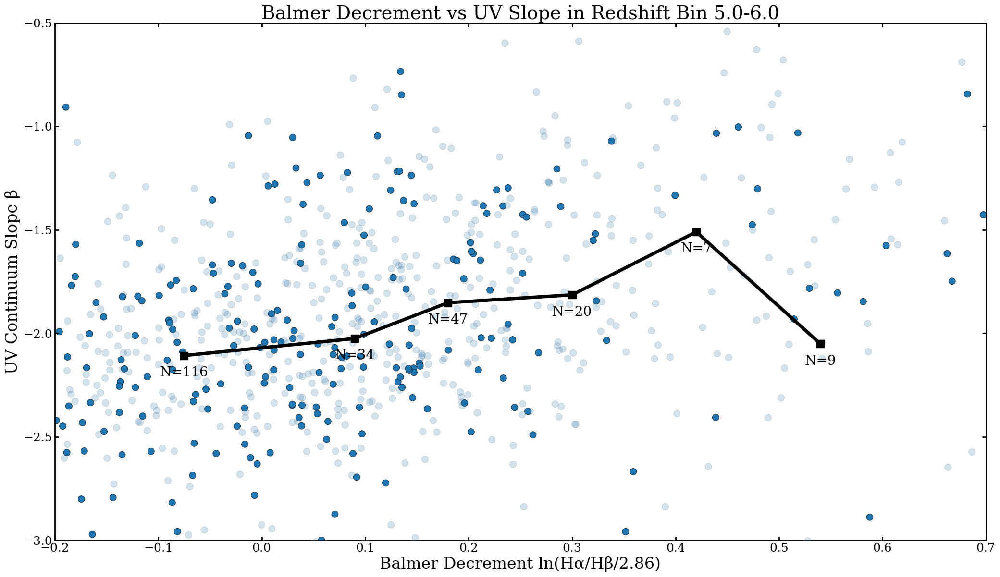

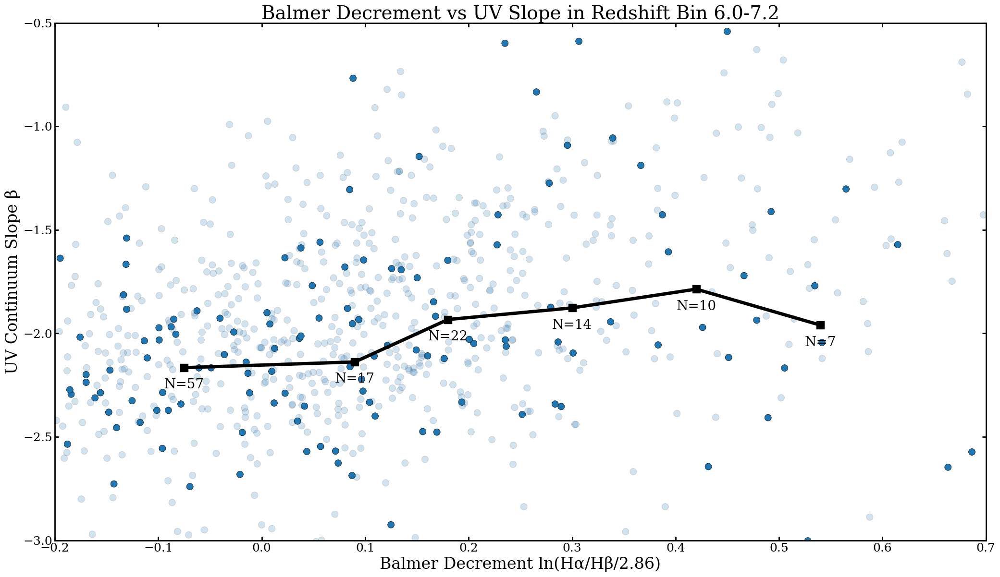

In [19]:
for redshift_bin_index in range(len(redshift_conditions)):
    balmer_decrement_list=[]
    beta_list=[]
    alpha_list=[]

    for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
        if not catalog['sample_flag']:
            continue
        redshift_bin_id=redshift_condition_func(catalog['determined_redshift'],redshift_conditions=redshift_conditions)
        if redshift_bin_id != redshift_bin_index:
            alpha_list.append(0.2)

        else:
            alpha_list.append(1.0)

        uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
        halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
        hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
        balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
        balmer_decrement_list.append(balmer_decrement)
        beta_list.append(uv_slope_value)

    balmer_decrement_array=np.array(balmer_decrement_list)
    beta_array=np.array(beta_list)
    alpha_array=np.array(alpha_list)

    fig, ax=plt.subplots(figsize=(25,14))
    sc=ax.scatter(balmer_decrement_array, beta_array, alpha=alpha_array, s=100, edgecolors='k', linewidths=0.5)
    ax.set_xlabel('Balmer Decrement ln(Hα/Hβ/2.86)', fontsize=24)
    ax.set_ylabel('UV Continuum Slope β', fontsize=24)
    ax.set_title(f'Balmer Decrement vs UV Slope in Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=28)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.spines['left'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    ax.xaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
    ax.yaxis.set_tick_params(width=2, direction='in', which='both', labelsize=18)
    ax.xaxis.set_tick_params(length=6, which='major')
    ax.xaxis.set_tick_params(length=3, which='minor')
    ax.yaxis.set_tick_params(length=6, which='major')
    ax.yaxis.set_tick_params(length=3, which='minor')
    ax.set_xlim(-0.2,0.7)
    ax.set_ylim(-3,-0.5)
    # plt.savefig(f'Balmer_Decrement_vs_UV_Slope_Redshift_Bin_{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}.pdf', bbox_inches='tight')









    group_conditions = [(-0.2,0.05),(0.06,0.12), (0.12,0.24),(0.24,0.36),(0.36,0.48),(0.48,0.6)]
    last_point_x=None
    last_point_y=None

    for lower, upper in group_conditions:
        group_mask = (balmer_decrement_array >= lower) & (balmer_decrement_array < upper) & (alpha_array==1.0)
        group_num=np.sum(group_mask)
        if group_num == 0:
            continue
        group_uv_slopes = beta_array[group_mask]

        lower_value=16
        upper_value=100-lower_value


        mask_lower_16_upper_84 = (group_uv_slopes >= np.percentile(group_uv_slopes,lower_value)) & (group_uv_slopes <= np.percentile(group_uv_slopes, upper_value))
        group_uv_slopes = group_uv_slopes[mask_lower_16_upper_84]


        weighted_mean_uv_slope = np.average(group_uv_slopes)

        mid_point = (lower + upper) / 2
        z=30

        ax.scatter(mid_point, weighted_mean_uv_slope,
                    marker='s', color='black', s=144,
                    label=f'Bin [{lower:.2f}, {upper:.2f}] Mean' if lower == group_conditions[0][0] else "", zorder=z)

        if last_point_x is not None and last_point_y is not None:
            ax.plot([last_point_x, mid_point], [last_point_y, weighted_mean_uv_slope], color='black', linewidth=5, zorder=z)
        last_point_x = mid_point
        last_point_y = weighted_mean_uv_slope

        plt.text(mid_point, weighted_mean_uv_slope-0.1, f'N={group_num}', fontsize=20, ha='center',zorder=z,c='black')
    plt.show()


(-0.2, 0.7)

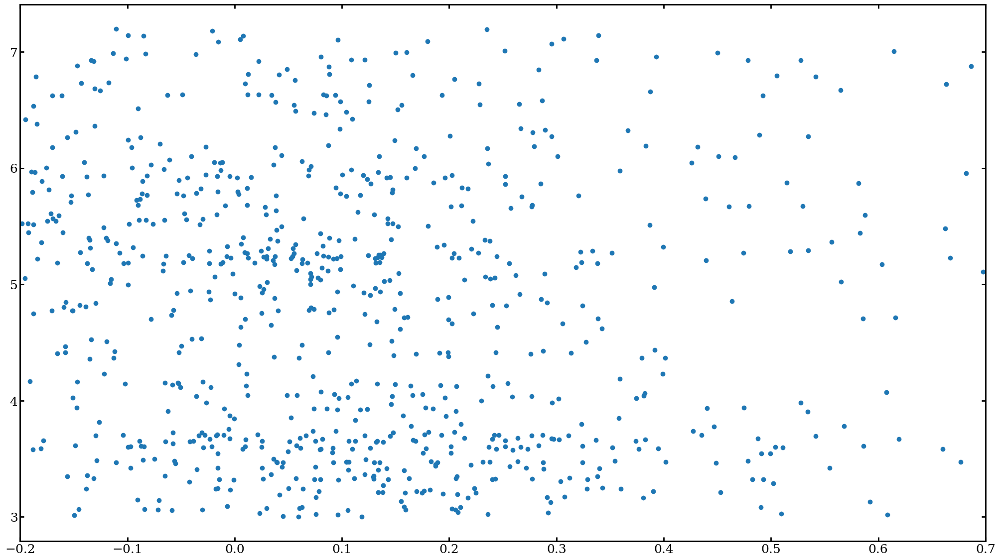

In [22]:
plt.scatter(balmer_decrement_array, redshift_list)
plt.xlim(-0.2,0.7)

Spectrum index 5 has invalid normalization factor. Skipping.


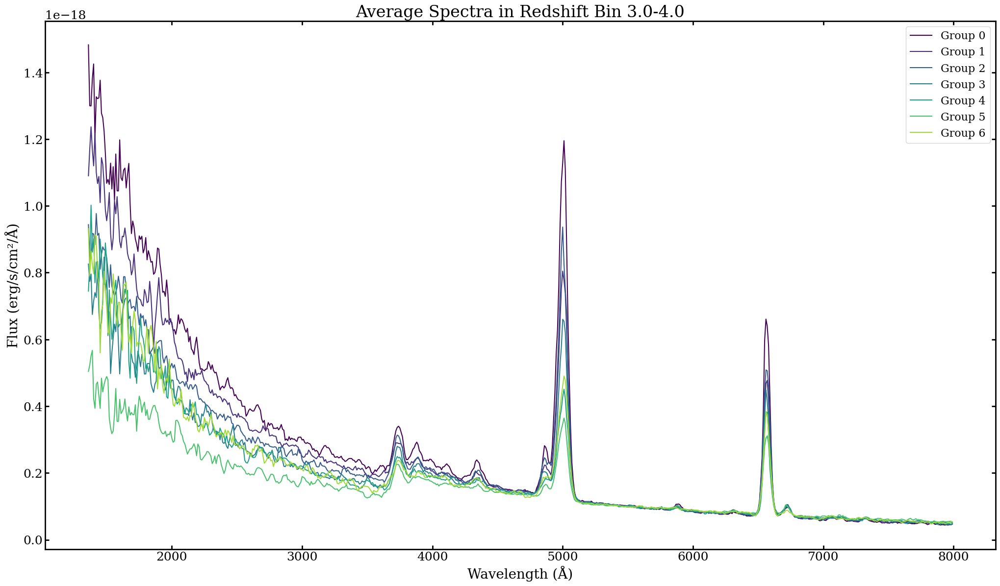

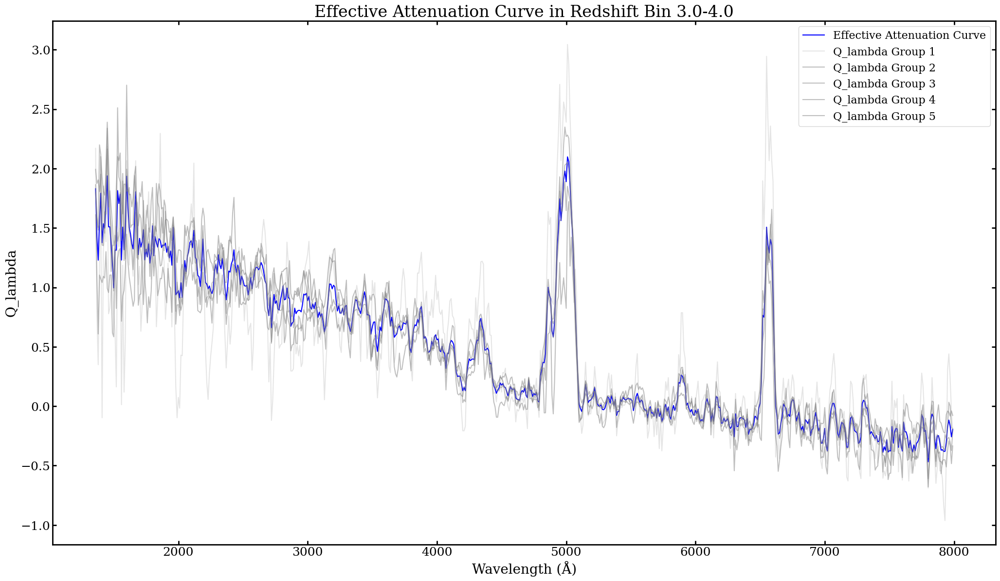

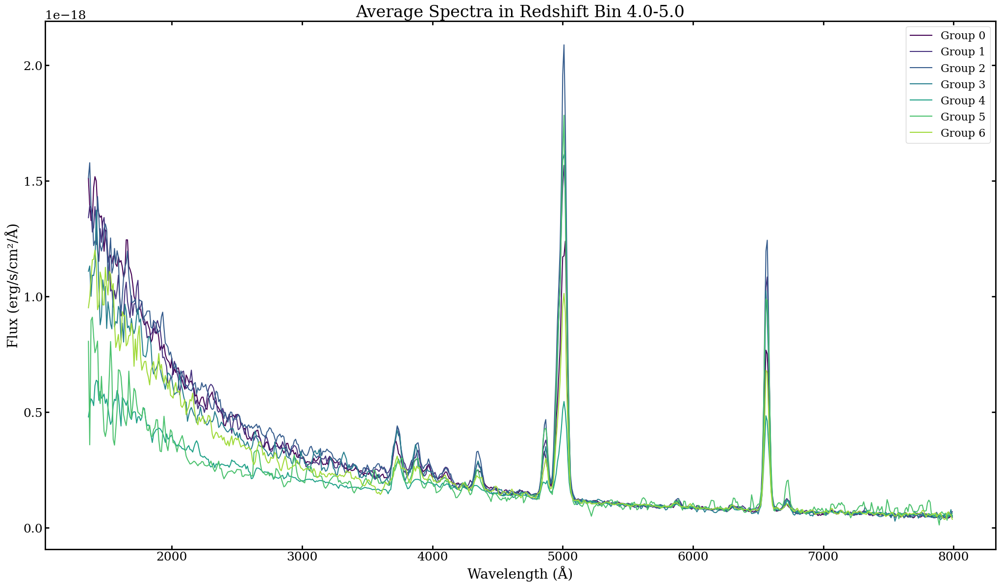

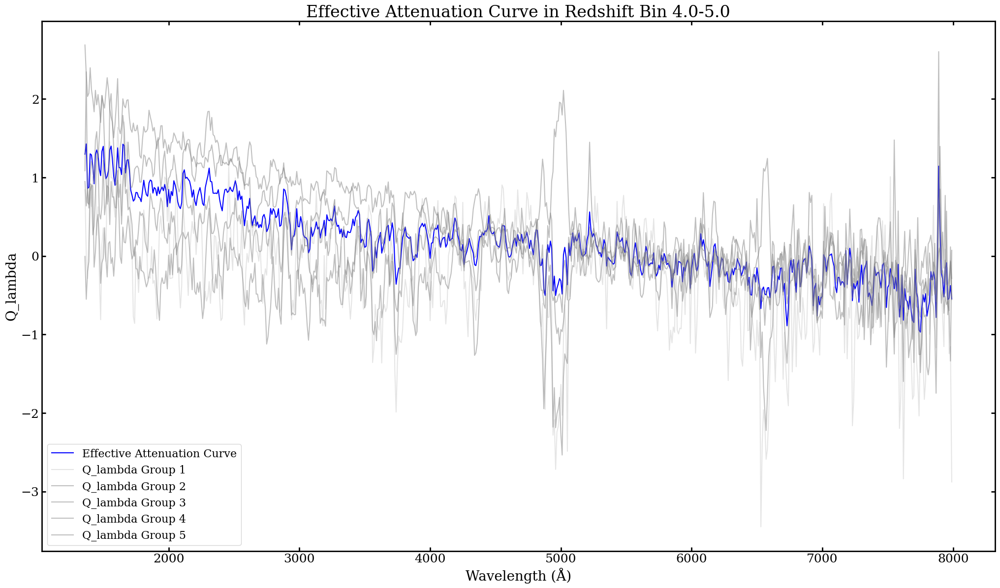

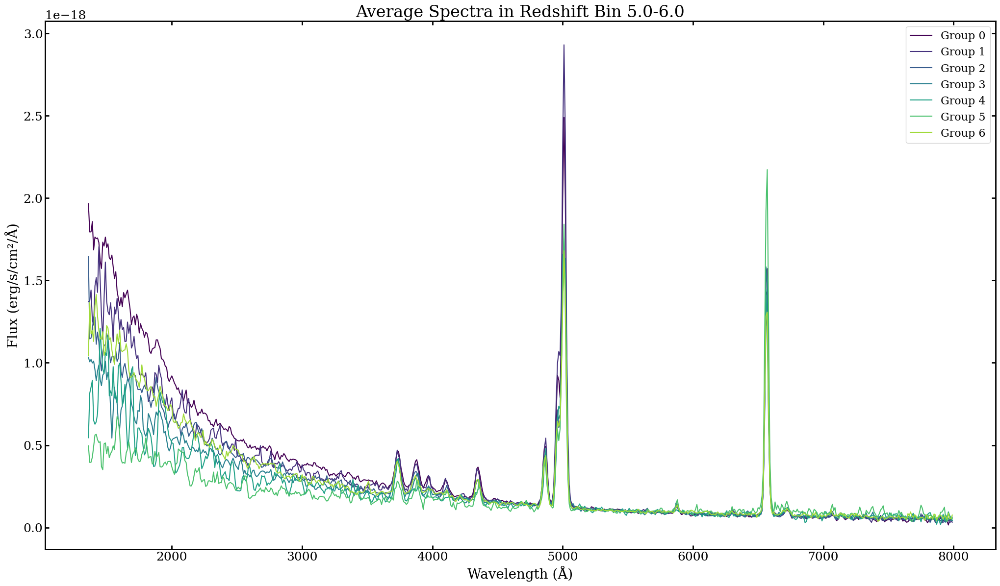

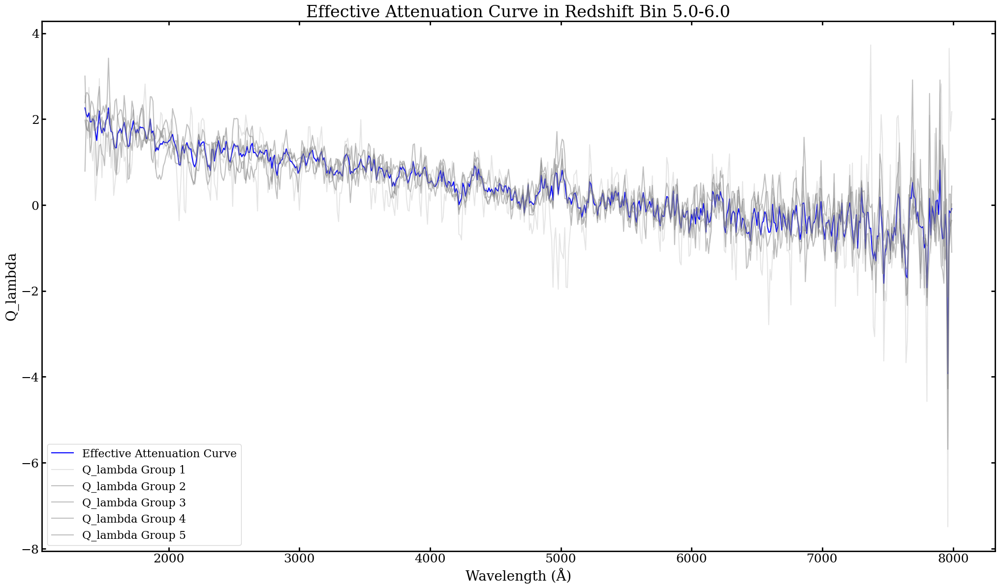

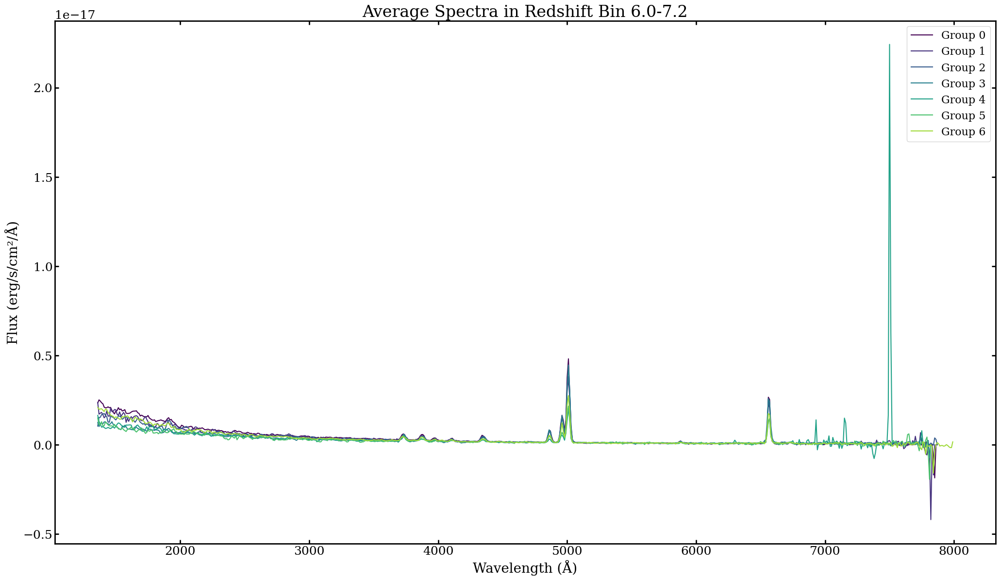

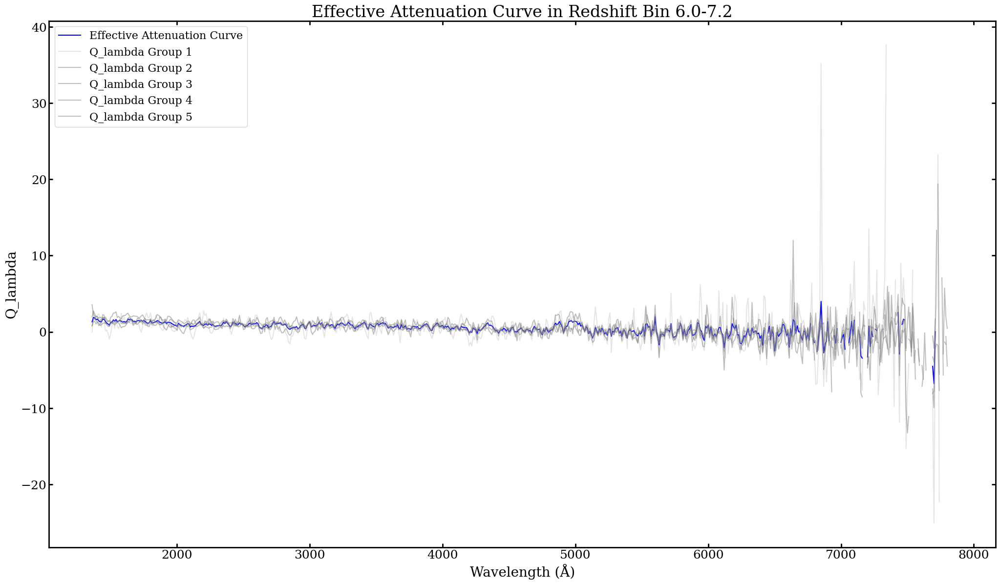

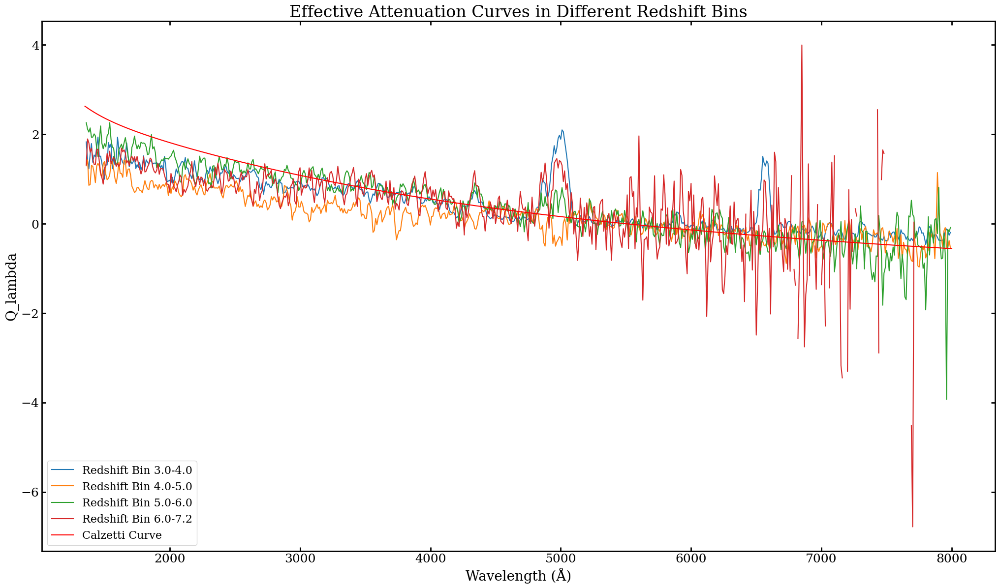

In [13]:
effective_attenuation_curve_list=[]
for redshift_bin_index in range(len(redshift_conditions)):

    group0_averager=FL.SpectrumAverager()
    group1_averager=FL.SpectrumAverager()
    group2_averager=FL.SpectrumAverager()
    group3_averager=FL.SpectrumAverager()
    group4_averager=FL.SpectrumAverager()
    group5_averager=FL.SpectrumAverager()
    group6_averager=FL.SpectrumAverager()


    for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
        if not catalog['sample_flag']:
            continue
        redshift_bin_id=redshift_condition_func(catalog['determined_redshift'],redshift_conditions=redshift_conditions)
        if redshift_bin_id != redshift_bin_index:
            continue

        uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
        halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
        hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
        balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
        group_index=group_condition_func(balmer_decrement)
        if group_index==-1:
            continue

        averager_to_use='group'+str(group_index)+'_averager'
        globals()[averager_to_use].load_spectrum_catalog([surveyid_subid],DJAv4Catalog)

    invalid_averager=np.zeros(7, dtype=bool)

    for i in range(7):
        try:
            averager_to_use='group'+str(i)+'_averager'
            globals()[averager_to_use].create_common_wavelength_grid(wavelength_range=(1350,8000),grid_size=10)
            globals()[averager_to_use].interpolate_spectra(interpolation_method='linear')
            globals()[averager_to_use].spectrum_normalization_within_range(wavelength_range=(5250,5750),target_flux=1e-19)
            globals()[averager_to_use].compute_average_spectrum(method='median', ignore_nan=True, use_percentile_filter=True, lower_percentile=16, upper_percentile=84)
            # globals()[averager_to_use].plot_average_spectrum(show_individual=True, show_average=True, show_error=True, figsize=(25,14), alpha=0.3, show_normalization_point=True, reference_wavelength=5500.0)
            invalid_averager[i]=False

        except Exception as e:
            print(f'Warning: Unable to compute average spectrum for Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}, Group {i}. Skipping this group.')
            invalid_averager[i]=True

    group_decrement_list=[]

    for i in range(6):
        decrement_list=[]

        for surveyid_subid, catalog in DJAv4Catalog.catalog_iterator():
            if not catalog['sample_flag']:
                continue

            uv_slope_value=catalog['dust_curve_parameters']['UV_Continuum_Fitting_Parameters']['exponent']
            halpha_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['halpha_flux']
            hbeta_flux=catalog['dust_curve_parameters']['Best_Balmer_Decrement_Line_Parameters']['hbeta_flux']
            balmer_decrement=np.log(halpha_flux/hbeta_flux/2.86)
            group_index=group_condition_func(balmer_decrement)
            if group_index!=i:
                continue
            if group_index==-1:
                continue

            decrement_list.append(balmer_decrement)

        group_decrement_list.append(np.mean(decrement_list))

    model_spectra=group0_averager.average_flux*u.erg/u.s/u.cm**2/u.AA
    tau_lambda_list=[]
    Q_lambda_list=[]

    for i in range(1,6):
        if invalid_averager[i]:
            Q_lambda_list.append(np.zeros_like(group0_averager.common_wavelength))
            continue
        averager_to_use='group'+str(i)+'_averager'
        tau_lambda_list=[]
        groupi_averager=globals()[averager_to_use]
        tau_lambda=-np.log( (groupi_averager.average_flux)/(group0_averager.average_flux) )
        tau_lambda_list.append(tau_lambda)
        Q_lambda=tau_lambda/ (group_decrement_list[i]-group_decrement_list[0])
        Q_lambda_list.append(Q_lambda)


    fig, ax=plt.subplots(figsize=(25,14))
    colors=plt.cm.viridis(np.linspace(0,7))
    for i in range(7):
        if invalid_averager[i]:
            continue
        averager_to_use='group'+str(i)+'_averager'
        averager=globals()[averager_to_use]
        ax.plot(averager.common_wavelength, averager.average_flux, color=colors[i], label='Group '+str(i))
    ax.set_xlabel('Wavelength (Å)', fontsize=20)
    ax.set_ylabel('Flux (erg/s/cm²/Å)', fontsize=20)
    ax.set_title(f'Average Spectra in Redshift Bin {redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=24)
    ax.legend(fontsize=16)
    plt.show()


    Q_lambda_array=np.array(Q_lambda_list)

    valid_weights = []
    for i in range(1,6):
        if not invalid_averager[i]:
            valid_weights.append(group_decrement_list[i]-group_decrement_list[0])

    effective_attenuation_curve=np.average(Q_lambda_array[~np.array(invalid_averager[1:-1])], axis=0, weights=valid_weights)
    fig, ax=plt.subplots(figsize=(25,14))
    averager=group1_averager
    ax.plot(averager.common_wavelength, effective_attenuation_curve, color='blue', label='Effective Attenuation Curve')
    for i in range(0,5):
        if invalid_averager[i+1]:
            continue
        Q_lambda=Q_lambda_list[i]
        averager_to_use='group'+str(i+1)+'_averager'
        averager=globals()[averager_to_use]
        ax.plot(averager.common_wavelength, Q_lambda, color='gray', alpha=0.5 if i!=0 else 0.2, label='Q_lambda Group '+str(i+1))
    plt.xlabel('Wavelength (Å)', fontsize=20)
    plt.ylabel('Q_lambda', fontsize=20)
    plt.title('Effective Attenuation Curve in Redshift Bin '+f'{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', fontsize=24)
    plt.legend(fontsize=16)
    plt.show()
    effective_attenuation_curve_list.append((averager.common_wavelength, effective_attenuation_curve))


colors=sns.color_palette( n_colors=len(redshift_conditions))

calzetti_curve=Calzetti((averager.common_wavelength*u.AA).to(u.micron).value)
fig, ax=plt.subplots(figsize=(25,14))
for redshift_bin_index in range(len(redshift_conditions)):
    common_wavelength, effective_attenuation_curve=effective_attenuation_curve_list[redshift_bin_index]
    ax.plot(common_wavelength, effective_attenuation_curve, label='Redshift Bin '+f'{redshift_conditions[redshift_bin_index][0]}-{redshift_conditions[redshift_bin_index][1]}', color=colors[redshift_bin_index])

ax.plot(averager.common_wavelength, calzetti_curve, color='red', label='Calzetti Curve')
plt.xlabel('Wavelength (Å)', fontsize=20)
plt.ylabel('Q_lambda', fontsize=20)
plt.title('Effective Attenuation Curves in Different Redshift Bins', fontsize=24)
plt.legend(fontsize=16)
plt.show()

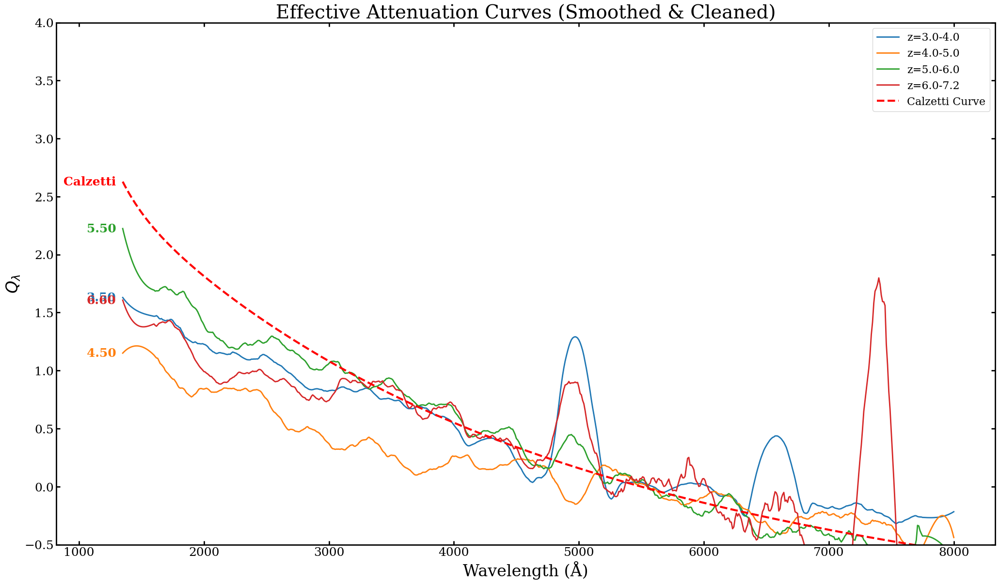

In [14]:
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import numpy as np
import pandas as pd

fig, ax = plt.subplots(figsize=(25, 14))

# 平滑参数
window_len = 51
poly_order = 3

for redshift_bin_index in range(len(redshift_conditions)):
    common_wavelength, effective_attenuation_curve = effective_attenuation_curve_list[redshift_bin_index]

    # --- 数据清洗与插值 ---
    series_curve = pd.Series(effective_attenuation_curve)
    curve_clean = series_curve.replace([np.inf, -np.inf], np.nan).interpolate(method='linear', limit_direction='both')
    curve_clean = curve_clean.to_numpy()

    if np.isnan(curve_clean).all():
        continue

    # --- 数据平滑 ---
    try:
        current_window_len = window_len
        if len(curve_clean) < window_len:
            current_window_len = len(curve_clean) if len(curve_clean) % 2 != 0 else len(curve_clean) - 1

        if current_window_len < poly_order + 2:
             smoothed_curve = curve_clean
        else:
             smoothed_curve = savgol_filter(curve_clean, window_length=current_window_len, polyorder=poly_order)

        # --- 绘图 ---
        line_color = colors[redshift_bin_index] # 获取当前颜色
        z_min, z_max = redshift_conditions[redshift_bin_index]
        label_text = f'z={z_min}-{z_max}' # 图例标签

        ax.plot(common_wavelength, smoothed_curve,
                label=label_text,
                color=line_color, linewidth=2)

        # --- 新增功能：在左侧标注红移中心 ---
        # 1. 计算红移中心
        z_center = (z_min + z_max) / 2

        # 2. 找到第一个有效数据点的位置（通常是索引0，但为了保险起见）
        # 这里直接取 index 0，因为 interpolate(limit_direction='both') 保证了开头有值
        x_start = common_wavelength[0]
        y_start = smoothed_curve[0]

        # 3. 使用 annotate 添加文本
        ax.annotate(f'{z_center:.2f}',               # 显示的文本 (保留2位小数)
                    xy=(x_start, y_start),           # 标注的数据点坐标
                    xytext=(-10, 0),                 # 文本偏移量：向左偏 10 个点，上下不偏
                    textcoords='offset points',      # 偏移量单位
                    ha='right',                      # 水平对齐：右对齐（文本尾部对着数据点）
                    va='center',                     # 垂直对齐：居中
                    color=line_color,                # 文本颜色与曲线一致
                    fontsize=18,                     # 字体大小
                    fontweight='bold')               # 字体加粗

    except Exception as e:
        print(f"Skipping bin {redshift_bin_index} due to error: {e}")
        # 出错时的兜底绘制
        ax.plot(common_wavelength, effective_attenuation_curve,
                label='Redshift Bin (Raw)', color=colors[redshift_bin_index], alpha=0.5)

# 绘制 Calzetti Curve
ax.plot(averager.common_wavelength, calzetti_curve, color='red', label='Calzetti Curve', linewidth=3, linestyle='--')
# 给 Calzetti 也加个标注 (可选)
ax.annotate('Calzetti',
            xy=(averager.common_wavelength[0], calzetti_curve[0]),
            xytext=(-10, 0), textcoords='offset points',
            ha='right', va='center', color='red', fontsize=18, fontweight='bold')

plt.xlabel('Wavelength (Å)', fontsize=24)
plt.ylabel(r'$Q_\lambda$', fontsize=24) # 支持 LaTeX 格式
plt.ylim(-0.5, 4)
plt.title('Effective Attenuation Curves (Smoothed & Cleaned)', fontsize=28)
plt.legend(fontsize=16)

# 稍微扩展 x 轴的左侧范围，给文字留出空间，防止文字被切掉
current_xlim = ax.get_xlim()
ax.set_xlim(current_xlim[0] - 200, current_xlim[1])
plt.savefig('Redshift_Binned_Effective_Attenuation_Curves_Smoothed_Labeled.pdf', bbox_inches='tight')
plt.show()